<a href="https://colab.research.google.com/github/MarinaSupiot/projet_7/blob/main/Analyse_avec_le_choix_des_variables.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
import gc
from hyperopt import hp
from hyperopt import tpe
from hyperopt import fmin
from hyperopt import space_eval, STATUS_OK
import plotly.express as px
from plotly.offline import iplot

from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler

import lightgbm as lgb
#!pip install lime
#from lime import lime_tabular

import matplotlib as mpl
%matplotlib inline
import matplotlib.pyplot as plt
import missingno as msno
import numpy as np
import pandas as pd
import pickle
import random
import re
import seaborn as sns
!pip install shap
import shap


import sklearn
from sklearn.dummy import DummyClassifier
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler


from sklearn.pipeline import Pipeline
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder

from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from sklearn.metrics import auc
from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix, fbeta_score

from sklearn.model_selection import cross_validate
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import KFold
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import train_test_split

!pip install scikit-plot
!pip install kds

import scikitplot as skplt
import kds

import pickle
import os



import time

# Versions
print('Version des librairies utilisées :')


print('Matplotlib            : ' + mpl.__version__)
print('Missingno             : ' + msno.__version__)
print('NumPy                 : ' + np.version.full_version)
print('Pandas                : ' + pd.__version__)
print('Seaborn               : ' + sns.__version__)
print('Shap                  : ' + shap.__version__)
print('Sklearn               : ' + sklearn.__version__ )

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 532.9/532.9 kB 11.0 MB/s eta 0:00:00
Version des librairies utilisées :
Matplotlib            : 3.7.1
Missingno             : 0.5.2
NumPy                 : 1.23.5
Pandas                : 1.5.3
Seaborn               : 0.12.2
Shap                  : 0.43.0
Sklearn               : 1.2.2


# Fonctions

In [6]:
pd.set_option('display.max_columns', 300)
pd.set_option('display.max_row', 500)
pd.set_option('display.max_colwidth', 200)

In [7]:
def timeit(f):
    '''
    fonction décoratrice qui donne le temps d'éxecution d'une autre fonction
    '''
    def timed(*args, **kw):

        ts = time.time()
        result = f(*args, **kw)
        te = time.time()

        print (f"Durée d'exécution de {f.__name__}: {te-ts}s")
        return result

    return timed

In [8]:
@timeit
def missing_values(df):
        '''
        Fonction qui calcule les valeurs manquantes d'un dataset

        '''
        # Nombre total de valeurs manquantes
        mis_val = df.isna().sum()

        # Pourcentage de valeurs manquantes
        mis_val_percent =(df.isnull().sum() / len(df))*100

        # Construction d'un tableau avec les résultats
        mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)

        # Renommage des colonnes
        mis_val_table_ren_columns = mis_val_table.rename(
        columns = {0 : 'Valeurs manquantes', 1 : '% total des valeurs'})

        # On range de manière décroissante
        mis_val_table_ren_columns = mis_val_table_ren_columns[
            mis_val_table_ren_columns.iloc[:,1] != 0].sort_values(
        '% total des valeurs', ascending=False).round(1)


        # Return the dataframe with missing information
        return mis_val_table_ren_columns

In [9]:
@timeit
def description_dataset(data, name):
    '''
    Return the description of a dataset

        Parameters:
            data: dataframe
            name:

        Returns:
            the 3 first line of the dataframe
            the shape, the types, the number of null values,
            the number of unique values, the number of duplicated values

    '''
    print("On traite le dataset ", name)
    msno.bar(data)

    display(data.head(3))
    print(f'Taille :-------------------------------------------------------------- {data.shape}')

    print("--"*50)
    print("Valeurs manquantes par colonnes (%): ")
    table = missing_values(data)
    display(table.head(50))

    print("--"*50)
    print("Valeurs différentes par variables : ")
    for col in data:
        if data[col].nunique() < 30:
            print (f'{col :-<70} {data[col].unique()}')
        else :
            print(f'{col :-<70} contient {data[col].nunique()} valeurs différentes')
    print("--"*50)
    print(f"Nombre de doublons : {data.duplicated().sum()}")

In [10]:
def cleaning_categories(col):
    '''
    Fonction qui nettoie une phrase de ses caractères spéciaux.
    Et la passe en majuscule( pour un passage en nom de colonne avec one hot)
    '''
    col = str(col).replace('-', '').replace('+', '').replace('/', ' ').replace(':', '_')
    col = str(col).upper()
    return col

In [11]:
@timeit
def cat_encoder(features, test_features):
    '''
    Fonction qui fais un one hot encodage sur les variables
    catégorielles à l'aide de get_dummies.
    Elle fais un label encoder sur les variables binaires.
    Elle traite les valeurs manquantes comme des catégories.
    Elle retourne les datasets encodés.
    '''
    label_encoder = LabelEncoder()

    categorical_columns_train  = []
    categorical_columns_test  = []

    for col in features :
        if col != "TARGET":
            if features[col].dtype == object:
                #Label encodage pour les variables binaires
                if features[col].nunique()==2:
                    features[col] = label_encoder.fit_transform(features[col])
                #récupération des colonnes où on fera un one hot encodage
                elif features[col].nunique()>2:
                    categorical_columns_train.append(col)

    features = pd.get_dummies(features, columns = categorical_columns_train,dummy_na= True)

    for col in test_features :
        if test_features[col].dtype == object:
            #Label encodage pour les variables binaires
            if test_features[col].nunique()==2:
                test_features[col] = label_encoder.fit_transform(test_features[col])
            #récupération des colonnes où on fera un one hot encodage
            elif test_features[col].nunique()>2:
                categorical_columns_test.append(col)

    test_features = pd.get_dummies(test_features,columns = categorical_columns_test, dummy_na= True)

    #Alignement des dataframes
    features, test_features = features.align(test_features, join= 'inner', axis=1)

    return features, test_features

In [12]:
### FONCTION POUR NETTOYER ET ENCODER LES DATAS

@timeit
def clean_data(train, test):

    # Valeurs abérantes
    train['DAYS_EMPLOYED_ANOM'] = train["DAYS_EMPLOYED"] == 365243
    test['DAYS_EMPLOYED_ANOM'] = test["DAYS_EMPLOYED"] == 365243

    train['DAYS_EMPLOYED'].replace({365243: np.nan}, inplace = True)
    test["DAYS_EMPLOYED"].replace({365243: np.nan}, inplace = True)

    #Création de feature
    df_train = train.copy()
    df_test = test.copy()

    #train data
    df_train['PROPORTION_LIFE_EMPLOYED'] = df_train['DAYS_EMPLOYED'] / df_train['DAYS_BIRTH']
    df_train['INCOME_TO_CREDIT_RATIO'] = df_train['AMT_INCOME_TOTAL'] / df_train['AMT_CREDIT']
    df_train['INCOME_TO_ANNUITY_RATIO'] = df_train['AMT_INCOME_TOTAL'] / df_train['AMT_ANNUITY']
    df_train['INCOME_TO_ANNUITY_RATIO_BY_AGE'] = df_train['INCOME_TO_ANNUITY_RATIO'] * df_train['DAYS_BIRTH']
    df_train['CREDIT_TO_ANNUITY_RATIO'] = df_train['AMT_CREDIT'] / df_train['AMT_ANNUITY']
    df_train['CREDIT_TO_ANNUITY_RATIO_BY_AGE'] = df_train['CREDIT_TO_ANNUITY_RATIO'] * df_train['DAYS_BIRTH']
    df_train['INCOME_TO_FAMILYSIZE_RATIO'] = df_train['AMT_INCOME_TOTAL'] / df_train['CNT_FAM_MEMBERS']
    df_train['ANNUITY_INCOME_PERC'] = df_train['AMT_ANNUITY'] / df_train['AMT_INCOME_TOTAL']

    #Test data
    df_test['PROPORTION_LIFE_EMPLOYED'] = df_test['DAYS_EMPLOYED'] / df_test['DAYS_BIRTH']
    df_test['INCOME_TO_CREDIT_RATIO'] = df_test['AMT_INCOME_TOTAL'] / df_test['AMT_CREDIT']
    df_test['INCOME_TO_ANNUITY_RATIO'] = df_test['AMT_INCOME_TOTAL'] / df_test['AMT_ANNUITY']
    df_test['INCOME_TO_ANNUITY_RATIO_BY_AGE'] = df_test['INCOME_TO_ANNUITY_RATIO'] * df_test['DAYS_BIRTH']
    df_test['CREDIT_TO_ANNUITY_RATIO'] = df_test['AMT_CREDIT'] / df_train['AMT_ANNUITY']
    df_test['CREDIT_TO_ANNUITY_RATIO_BY_AGE'] = df_test['CREDIT_TO_ANNUITY_RATIO'] * df_test['DAYS_BIRTH']
    df_test['INCOME_TO_FAMILYSIZE_RATIO'] = df_test['AMT_INCOME_TOTAL'] / df_test['CNT_FAM_MEMBERS']
    df_test['ANNUITY_INCOME_PERC'] = df_test['AMT_ANNUITY'] / df_test['AMT_INCOME_TOTAL']

    features=df_train.copy()
    test_features=df_test.copy()

    # Extraction des ID

    train_ids = features["SK_ID_CURR"]
    test_ids = test_features["SK_ID_CURR"]


    # Extraction des Targets
    labels = features['TARGET']

    #labels.reset_index(drop=True, inplace=True)

    # Suppression des ID and target
    features = features.drop(columns = ['SK_ID_CURR', 'TARGET'])
    test_features = test_features.drop(columns = ['SK_ID_CURR'])

    features, test_features = cat_encoder(features, test_features)


    # Extraction des noms des Feature
    feat_name = list(features.columns)

    #Imputation des Nan
    imputer = SimpleImputer(strategy = 'median')

    features = imputer.fit_transform(features)
    test_features = imputer.transform(test_features)

    # Scale les features
    scaler = MinMaxScaler(feature_range = (0, 1))

    features = scaler.fit_transform(features)
    test_features = scaler.transform(test_features)

    # Création des dataset
    features_set=pd.DataFrame(features,columns=feat_name)
    test_features_set=pd.DataFrame(test_features,columns=feat_name)

    #Ajout de la colonne TARGET et des ids
    features_set['TARGET']=labels
    features_set["SK_ID_CURR"] = train_ids
    test_features_set['SK_ID_CURR'] = test_ids

    #Passage des id en index
    features_set.set_index('SK_ID_CURR', inplace = True)
    test_features_set.set_index('SK_ID_CURR',inplace = True)

    print('Training Data Shape: ', features_set.shape)
    print('Testing Data Shape: ', test_features_set.shape)

    return features_set, test_features_set

In [13]:
@timeit
def echantillonage(df_X, df_y):
    X = df_X.copy()
    y = df_y.copy()

    X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.2, random_state = 42)

    return X_train, X_valid, y_train, y_valid

In [14]:
@timeit
def plot_roc_curve(classifiers, X, y, n_splits=5):

    kf = KFold(n_splits=n_splits)
    for name_clf, clf in classifiers.items():
        print(name_clf)
        tprs = []
        aucs = []
        mean_fpr = np.linspace(0, 1, 100)
        for i, (train, test) in enumerate(kf.split(X, y)):

            clf.fit(X.iloc[train, :], y.iloc[train])

            y_pred_grd = clf.predict_proba(X.iloc[test, :])[:, 1]
            fpr, tpr, thresholds = roc_curve(y.iloc[test], y_pred_grd)

            interp_tpr = np.interp(mean_fpr, fpr, tpr)
            interp_tpr[0] = 0.0
            tprs.append(interp_tpr)
            thresholds = auc(fpr, tpr)

            aucs.append(thresholds)

        mean_tpr = np.mean(tprs, axis=0)
        mean_tpr[-1] = 1.0
        mean_auc = auc(mean_fpr, mean_tpr)
        std_auc = np.std(aucs)
        plt.plot(mean_fpr, mean_tpr,
            label=name_clf + r'(AUC = %0.2f $\pm$ %0.2f)' % (mean_auc, std_auc),
            lw=2,
            alpha=.8)

    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

In [15]:
def cout_metier(y_true, y_pred, fn_value=-10, fp_value=-1, vp_value=0, vn_value=1):
    mat_conf = confusion_matrix(y_true, y_pred)
    vn = mat_conf[0, 0]
    fn = mat_conf[1, 0]
    fp = mat_conf[0, 1]
    vp = mat_conf[1, 1]
    J = vp * vp_value + vn * vn_value + fp * fp_value + fn * fn_value
    # Coût maximum
    max_J = (fp + vn)*vn_value + (fn + vp)*vp_value

    # Coût minimum
    min_J = (fp + vn)*fp_value + (fn + vp)*fn_value

    # Coût normalisé entre 0 et 1
    J_normalized = (J - min_J)/(max_J - min_J)

    return J_normalized

In [16]:
@timeit

def optimisation_model(set_data,predictor,metric,n_folds = 5,smote=False,under=False,sm_un = False, n_ite_baye = 10 ):
    data = set_data.copy()

  # Extraction des ID
    train_ids = data['SK_ID_CURR']

  #Extraction des targets
    targets = data['TARGET']

  # Remove the ids and target
    data = data.drop(columns = ['SK_ID_CURR', 'TARGET'])

  ### Fonction de cross validation
    def CV_kfol(X,Y,model_classific,metric,seuil_p,n_folds = 5,smote=False,under=False,sm_un = False ):

        features = X.copy()
        labels = Y.copy()

        #Extraction des feature names
        feature_names = list(features.columns)

        #Convertion en np arrays
        features = np.array(features)

        #Creation du kfold
        k_fold = KFold(n_splits = n_folds, shuffle = True, random_state = seed)

        #Vecteur vide pour feature importances
        feature_importance_values = np.zeros(len(feature_names))

        #Vecteur vide pour prediction sur validation
        prediction = np.zeros(features.shape[0])

        #Liste pour stocker les validation et training scores
        valid_scores = []

        #Boucle pour chaque fold
        n_boucl=0
        for train_indices, valid_indices in k_fold.split(features):
            n_boucl +=1
            model = model_classific

            #Training data
            train_features, train_labels = features[train_indices], labels[train_indices]

            #rééquilibrage
            if smote == True :

                sm = SMOTE(random_state=seed, k_neighbors=10)
                train_features, train_labels = sm.fit_resample(train_features, train_labels)

            elif under == True :

                us = RandomUnderSampler(sampling_strategy='majority', random_state=seed)
                train_features, train_labels = us.fit_resample(train_features, train_labels)

            elif sm_un == True :

                sm = SMOTE(sampling_strategy=0.4, random_state=seed, k_neighbors=10)
                X_train_resampled, y_train_resampled = sm.fit_resample(train_features, train_labels)
                us = RandomUnderSampler(sampling_strategy=1, random_state=seed)
                train_features, train_labels = us.fit_resample(X_train_resampled, y_train_resampled)






            #Validation data
            valid_features, valid_labels = features[valid_indices], labels[valid_indices]

            #Train du model
            model.fit(train_features, train_labels)

            #Récupération du best_iteration
            best_iteration = model.best_iteration_

            #Récupération des feature importances
            feature_importance_values += model.feature_importances_ / k_fold.n_splits

            #Récupération des predictions des validations
            prediction[valid_indices] = model.predict_proba(valid_features, num_iteration = best_iteration)[:, 1]

            y_pred = (prediction[valid_indices] > seuil_p)
            y_pred = np.array(y_pred > 0) * 1

            #Evaluation du model avec la metric
            valid_score = metric(labels[valid_indices],y_pred,seuil_p)
            #print('score de la boucle CV =',valid_score)

            #Récupération des best score
            valid_scores.append(valid_score)

            #Clean mémoire
            gc.enable()
            del model, train_features, valid_features
            gc.collect()

        return valid_scores#, feature_names, feature_importance_values

    #np.random.seed(42)
    ### Fonction a optimiser
    def optimize_rf(params,
                  model_optim=predictor,
                  X=data,
                  Y=targets,
                  metric=metric,
                  n_folds=n_folds,
                  smote=smote,
                  under=under,
                  sm_un = sm_un
                  ):
        params_model = {'n_estimators': int(params['n_estimators']),
                    'max_depth': int(params['max_depth']),
                    'learning_rate': params['learning_rate'],
                    'subsample': params['subsample'],
                    'colsample_bytree': params['colsample_bytree'],
                    'num_leaves': int(params['num_leaves']),
                    'reg_alpha': params['reg_alpha'],
                    'reg_lambda': params['reg_lambda']
                       }

        model_optim.set_params(**params_model, class_weight = 'balanced')
        seuil_p = params['seuil']

        #Cross validation
        valid_score= CV_kfol(X,
                             Y,
                             model_optim,
                             metric,
                             seuil_p,
                             n_folds = n_folds,
                             smote = smote,
                             under = under,
                             sm_un = sm_un
                            )

        #Moyenne des score de validation
        valid_loss_moy= 1-np.mean(valid_score)

        return valid_loss_moy

    np.random.seed(42)
    #espace des parameters
    space={'n_estimators': hp.quniform('n_estimators', 200, 2000, 200),
          'max_depth' : hp.quniform('max_depth', 2, 30, 2),
          'learning_rate': hp.loguniform('learning_rate', np.log(0.005), np.log(0.2)),
          'subsample': hp.quniform('subsample', 0.1, 1.0, 0.2),
          'colsample_bytree': hp.quniform('colsample_by_tree', 0.6, 1.0, 0.1),
          'num_leaves': hp.quniform('num_leaves', 4, 100, 4),
          'reg_alpha': hp.quniform('reg_alpha', 0.1, 1.0, 0.1),
          'reg_lambda': hp.quniform('reg_lambda', 0.1, 1.0, 0.1),
          'seuil': hp.quniform('seuil', 0.0, 1.0, 0.025)
            }

    #Optimisation
    optim=fmin(fn=optimize_rf,
                space=space,
                algo=tpe.suggest, # selection des paramètre automatiquement
                max_evals=n_ite_baye, # nb iterations
                rstate=np.random.seed(42)
      )

    #configuration du modèle avec les paramètres optimisés
    predictor.set_params(
                  n_estimators=int(optim['n_estimators']),
                  max_depth=int(optim['max_depth']),
                  learning_rate=optim['learning_rate'],
                  subsample=optim['subsample'],
                  colsample_bytree=optim['colsample_by_tree'],
                  num_leaves=int(optim['num_leaves']),
                  reg_alpha=optim['reg_alpha'],
                  reg_lambda=optim['reg_lambda']
                    )

    #Entrainement du modèle sur tout le jeux de données
    predictor.fit(data, targets)

    #Récupération des best parameters
    best_parameters = optim

    #Récupération des feature importances
    feature_importance_values = predictor.feature_importances_

    return best_parameters, feature_importance_values, predictor

In [17]:
skf = StratifiedKFold(n_splits=2)
@timeit
def model_v1(predictor, features, labels, eval_metric, cv=skf, smote = True):


    # Extract the ids
    train_ids = features.index

    # Extract the targets for training
    targets = labels

    # Remove the ids and target
    features = features

    # Extract feature names
    feature_names = list(features.columns)

    # Apply the pipeline
    #features = pipeline.fit_transform(features)
    targets = np.array(targets)

    # Ensure all data is stored as floats
    #features = features.astype(np.float64)

    if smote == True:
        # Increase the data to get a bigger proportion of positif targets
        sm = SMOTE(random_state=seed, sampling_strategy=0.2)
        # the ratio is chosen to correspond to the pareto law with the 80%/20% ratio
        features_res, targets_res = sm.fit_resample(features, targets.ravel())

    else:

        us = RandomUnderSampler(sampling_strategy='majority', random_state=seed)
        features_res, targets_res = us.fit_resample(features, targets.ravel())

    def optim_score(params,
                    model=predictor,
                    x_train=features_res,
                    y_train=targets_res,
                    cv=cv,
                    eval_metric=eval_metric):

        # the function gets a set of variable parameters in "param"
        params_model = {'n_estimators': int(params['n_estimators']),
                        'max_depth': int(params['max_depth']),
                        'num_leaves': int(params['num_leaves'])
        }

        # asssigne les paramètres du modèle
        model.set_params(**params_model)

        # Seuil de solvabilité
        threshold = params['solvability_threshold']

        # Cross-validation à 5 passes : retourne le score de probabilité
        # cross_val_predict returns an array of the same size as `y` where each entry
        # is a prediction obtained by cross validation:
        y_proba = cross_val_predict(model,
                                    x_train,
                                    y_train,
                                    method='predict_proba',
                                    cv=cv)[:, 1]

        # Si proba > seuil alors la prédiction est positive : 1
        y_pred = (y_proba > threshold)
        y_pred = np.array(y_pred > 0) * 1

        # Calcul du score suivant la métrique utilisé
        score = eval_metric(y_train, y_pred)

        return 1 - score # Retourne le score


    # possible values of parameters
    search_space={'n_estimators': hp.quniform('n_estimators', 1000, 10000, 1000),
                  'max_depth' : hp.quniform('max_depth', 2, 30, 5),
                  'num_leaves': hp.quniform('num_leaves', 4, 40, 4),
                  'learning_rate': hp.loguniform('learning_rate', np.log(0.005), np.log(0.2)),
           'solvability_threshold': hp.quniform('solvability_threshold', 0.0, 1.0, 0.025)
    }


    best=fmin(fn=optim_score, # function to optimize
              space=search_space,
              algo=tpe.suggest, # optimization algorithm, hyperotp will select its parameters automatically
              max_evals=5, # maximum number of iterations
    )
    #This means that Hyperopt will use the ‘Tree of Parzen Estimators’ (tpe) which is a Bayesian approach.
    print(best)

    # computing the score on the test set
    predictor.set_params(
                   n_estimators=int(best['n_estimators']),
                   max_depth=int(best['max_depth']),
                   num_leaves=int(best['num_leaves']),
                   learning_rate=best['learning_rate']
                    )

    # Entrainement du modèle sur tout le jeux de données
    predictor.fit(features, targets)

    # Record the best parameters
    best_parameters = best

    # Assemblage de pipeline
    #full_pipeline = define_pipeline(pipeline, predictor)

    # Record the feature importances
    feature_importance_values = predictor.feature_importances_

    # Make the feature importance dataframe
    feature_importances = pd.DataFrame({'feature': feature_names,
                                        'importance': feature_importance_values})

    return best_parameters, feature_importances, predictor


In [18]:
@timeit
def afficher_matrice_confusion(y_true, y_pred, title):

    plt.figure(figsize=(6, 4))

    cm = confusion_matrix(y_true, y_pred)

    #labels = ['Non défaillants', 'Défaillants']

    group_names = ['Vrai Neg','Faux Pos','Faux Neg','Vrai Pos']

    group_counts = ["{0:0.0f}".format(value) for value in cm.flatten()]

    group_percentages = ["{0:.2%}".format(value) for value in cm.flatten()/np.sum(cm)]

    labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in zip(group_names,group_counts,group_percentages)]

    labels = np.asarray(labels).reshape(2,2)

    sns.heatmap(cm,
                #xticklabels=labels,
                #yticklabels=labels,
                annot=labels,
                fmt='',
                cmap=plt.cm.Blues)
    plt.title(f'Matrice de confusion de : {title}')
    plt.ylabel('Classe réelle')
    plt.xlabel('Classe prédite')
    plt.show()

In [19]:
def score_validation_set(model):
    '''
    Fonction de prédiction sur le set de validation
    '''
    name=[]
    score=[]
    target_0=[]
    target_1=[]
    target_0_1=[]
    target_1_1=[]
    seuil=0.52
    for i,j in model.items():
        y_test_proba=j.predict_proba(val_set.drop(['TARGET'],axis=1))[:, 1]
        name.append(i)
        y_pred = j.predict(val_set.drop(['TARGET'],axis=1))
        score.append(cout_metier(val_set['TARGET'],y_pred))


        y_seuil_test=[]
        for i in y_test_proba:
            if i >= seuil:
                y_seuil_test.append(1)
            elif i < seuil:
                y_seuil_test.append(0)

        pred_frame=pd.DataFrame(y_seuil_test)
    #display(pred_frame)
        target_0_1.append((pred_frame.value_counts()/len(pred_frame)*100)[0].item())
        target_0.append((pred_frame.value_counts())[0].item())
        target_1_1.append((pred_frame.value_counts()/len(pred_frame)*100)[1].item())
        target_1.append((pred_frame.value_counts())[1].item())


    return name,score,target_0_1, target_0, target_1_1, target_1

In [20]:
def display_importances(features_importance_df_, train_set):
    feat_valu = features_importance_df_
    feat_name = train_set.drop(['SK_ID_CURR','TARGET'], axis = 1).columns
    feat_imp = pd.DataFrame()
    feat_imp['feature'] = feat_name
    feat_imp['importance'] = feat_valu
    cols = feat_imp[["feature", "importance"]].groupby("feature").mean().sort_values(by="importance", ascending=False)[:40].index
    best_features = feat_imp.loc[feat_imp.feature.isin(cols)]
    plt.figure(figsize=(8, 10))
    sns.barplot(x="importance", y="feature", data=best_features.sort_values(by="importance", ascending=False))
    plt.title('LightGBM Features (avg over folds)')
    plt.tight_layout()


In [21]:
def plot_precision_recall_vs_threshold(X, y, model):
    d = calculs_seuil (X, y, model)
    fig = plt.figure(figsize= (8,5))
    plt.plot(d['Seuil'], d['Précision'], "b--", label="Précision")
    plt.plot(d['Seuil'], d['Recall'], "g-", label="Recall")
    plt.legend()

#plot_precision_recall_vs_threshold(X_train, y_train, test_model)

In [22]:
#FONCTION POUR AFFICHER LE SEUIL, PRECISION, RECALL
def calculs_seuil (X, y, model):
    from sklearn.metrics import precision_recall_curve
    precision, recall, thresholds = precision_recall_curve(y, model.predict_proba(X)[:,1])
    data_seuil = pd.DataFrame({'Seuil':thresholds, 'Précision': precision[:-1], 'Recall': recall[:-1]})
    return data_seuil

#calculs_seuil(X_train, y_train, test_model)

## Import train et test df

In [ ]:
df_test = pd.read_csv('/content/drive/MyDrive/Projet 7/df_test.csv', sep = ',')
df_train = pd.read_csv('/content/drive/MyDrive/Projet 7/df_train.csv', sep = ',')

In [ ]:
df_train

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,DAYS_EMPLOYED_ANOM
0,100002,1,CASH LOANS,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,UNACCOMPANIED,Working,Secondary / secondary special,SINGLE NOT MARRIED,HOUSE APARTMENT,0.018801,-9461,-637.0,-3648.0,-2120,NaN,1,1,0,1,1,0,LABORERS,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.0220,0.0198,0.0,0.0000,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.0000,reg oper account,BLOCK OF FLATS,0.0149,"STONE, BRICK",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,False
1,100003,0,CASH LOANS,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,FAMILY,State servant,Higher education,MARRIED,HOUSE APARTMENT,0.003541,-16765,-1188.0,-1186.0,-291,NaN,1,1,0,1,1,0,CORE STAFF,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.0790,0.0554,0.0,0.0000,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.0100,reg oper account,BLOCK OF FLATS,0.0714,BLOCK,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,False
2,100004,0,REVOLVING LOANS,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,UNACCOMPANIED,Working,Secondary / secondary special,SINGLE NOT MARRIED,HOUSE APARTMENT,0.010032,-19046,-225.0,-4260.0,-2531,26.0,1,1,1,1,1,0,LABORERS,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N

In [ ]:
df_test

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,DAYS_EMPLOYED_ANOM
0,100001,CASH LOANS,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,UNACCOMPANIED,Working,Higher education,MARRIED,HOUSE APARTMENT,0.018850,-19241,-2329.0,-5170.0,-812,NaN,1,1,0,1,0,1,NAN,2.0,2,2,TUESDAY,18,0,0,0,0,0,0,Kindergarten,0.752614,0.789654,0.159520,0.0660,0.0590,0.9732,NaN,NaN,NaN,0.1379,0.1250,NaN,NaN,NaN,0.0505,NaN,NaN,0.0672,0.0612,0.9732,NaN,NaN,NaN,0.1379,0.1250,NaN,NaN,NaN,0.0526,NaN,NaN,0.0666,0.0590,0.9732,NaN,NaN,NaN,0.1379,0.1250,NaN,NaN,NaN,0.0514,NaN,NaN,NaN,BLOCK OF FLATS,0.0392,"STONE, BRICK",No,0.0,0.0,0.0,0.0,-1740.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,False
1,100005,CASH LOANS,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,UNACCOMPANIED,Working,Secondary / secondary special,MARRIED,HOUSE APARTMENT,0.035792,-18064,-4469.0,-9118.0,-1623,NaN,1,1,0,1,0,0,LOWSKILL LABORERS,2.0,2,2,FRIDAY,9,0,0,0,0,0,0,Self-employed,0.564990,0.291656,0.432962,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NAN,NaN,NAN,NaN,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0,False
2,100013,CASH LOANS,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,NAN,Working,Higher education,MARRIED,HOUSE APARTMENT,0.019101,-20038,-4458.0,-2175.0,-3503,5.0,1,1,0,1,0,0,DRIVERS,2.0,2,2,MONDAY,14,0,0,0,0,0,0,Transport: type 3,NaN,0.699787,0.610991,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NAN,NaN,NAN,NaN,0.0,0.0,0.0,0.0,-856.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0,False
3,100028,CASH LOANS,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,UNACCOMPANIED,Workin

In [ ]:
df_train.shape[0]

307500

In [ ]:
df_test.isna().sum().sort_values() / df_test.shape[0] * 100

SK_ID_CURR                       0.000000
REG_REGION_NOT_WORK_REGION       0.000000
LIVE_REGION_NOT_WORK_REGION      0.000000
REG_CITY_NOT_LIVE_CITY           0.000000
REG_CITY_NOT_WORK_CITY           0.000000
LIVE_CITY_NOT_WORK_CITY          0.000000
ORGANIZATION_TYPE                0.000000
HOUSETYPE_MODE                   0.000000
WALLSMATERIAL_MODE               0.000000
DAYS_LAST_PHONE_CHANGE           0.000000
FLAG_DOCUMENT_2                  0.000000
FLAG_DOCUMENT_3                  0.000000
FLAG_DOCUMENT_4                  0.000000
FLAG_DOCUMENT_5                  0.000000
FLAG_DOCUMENT_6                  0.000000
FLAG_DOCUMENT_7                  0.000000
FLAG_DOCUMENT_8                  0.000000
FLAG_DOCUMENT_9                  0.000000
FLAG_DOCUMENT_10                 0.000000
FLAG_DOCUMENT_11                 0.000000
FLAG_DOCUMENT_12                 0.000000
FLAG_DOCUMENT_13                 0.000000
FLAG_DOCUMENT_14                 0.000000
FLAG_DOCUMENT_15                 0

In [ ]:
df_train.isna().sum().sort_values() / df_train.shape[0] * 100

SK_ID_CURR                       0.000000
REG_REGION_NOT_LIVE_REGION       0.000000
REG_REGION_NOT_WORK_REGION       0.000000
LIVE_REGION_NOT_WORK_REGION      0.000000
REG_CITY_NOT_LIVE_CITY           0.000000
REG_CITY_NOT_WORK_CITY           0.000000
LIVE_CITY_NOT_WORK_CITY          0.000000
ORGANIZATION_TYPE                0.000000
HOUSETYPE_MODE                   0.000000
WALLSMATERIAL_MODE               0.000000
FLAG_DOCUMENT_2                  0.000000
FLAG_DOCUMENT_3                  0.000000
FLAG_DOCUMENT_4                  0.000000
FLAG_DOCUMENT_5                  0.000000
FLAG_DOCUMENT_6                  0.000000
FLAG_DOCUMENT_7                  0.000000
FLAG_DOCUMENT_8                  0.000000
FLAG_DOCUMENT_9                  0.000000
FLAG_DOCUMENT_10                 0.000000
FLAG_DOCUMENT_11                 0.000000
FLAG_DOCUMENT_12                 0.000000
FLAG_DOCUMENT_13                 0.000000
FLAG_DOCUMENT_14                 0.000000
FLAG_DOCUMENT_15                 0

In [ ]:
condition = df_train.isna().sum().sort_values() / df_train.shape[0] * 100 < 40
df_filtered = df_train.loc[:, condition]
df_filtered

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,HOUSETYPE_MODE,WALLSMATERIAL_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,DAYS_EMPLOYED_ANOM
0,100002,1,CASH LOANS,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,UNACCOMPANIED,Working,Secondary / secondary special,SINGLE NOT MARRIED,HOUSE APARTMENT,0.018801,-9461,-637.0,-3648.0,-2120,1,1,0,1,1,0,LABORERS,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.262949,0.139376,BLOCK OF FLATS,"STONE, BRICK",2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,False
1,100003,0,CASH LOANS,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,FAMILY,State servant,Higher education,MARRIED,HOUSE APARTMENT,0.003541,-16765,-1188.0,-1186.0,-291,1,1,0,1,1,0,CORE STAFF,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.622246,NaN,BLOCK OF FLATS,BLOCK,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,False
2,100004,0,REVOLVING LOANS,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,UNACCOMPANIED,Working,Secondary / secondary special,SINGLE NOT MARRIED,HOUSE APARTMENT,0.010032,-19046,-225.0,-4260.0,-2531,1,1,1,1,1,0,LABORERS,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.555912,0.729567,NAN,NAN,0.0,0.0,0.0,0.0,-815.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,False
3,100006,0,CASH LOANS,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,UNACCOMPANIED,Working,Secondary / secondary special,CIVIL MARRIAGE,HOUSE APARTMENT,0.008019,-19005,-3039.0,-9833.0,-2437,1,1,0,1,0,0,LABORERS,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,0.650442,NaN,NAN,NAN,2.0,0.0,2.0,0.0,-617.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,False
4,100007,0,CASH LOANS,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,UNACCOMPANIED,Working,Secondary / secondary special,SINGLE NOT MARRIED,HOUSE APARTMENT,0.028663,-19932,-3038.0,-4311.0,-3458,1,1,0,1,0,0,CORE STAFF,1.0,2,2,THURSDAY,11,0,0,0,0,1,1,Religion,0.322738,NaN,NAN,NAN,0.0,0.0,0.0,0.0,-1106.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307495,456251,0,CASH LOANS,M,N,N,0,157500.0,254700.0,27558.0,225000.0,UNACCOMPANIED,Working,Secondary / secondary special,SEPARATED,WITH PARENTS,0.032561,-9327,-236.0,-8456.0,-1982,1,1,0,1,0,0,SALES STAFF,1.0,1,1,THURSDAY,15,0,0,0,0,0,0,Services,0.681632,NaN,BLOCK OF FLATS,"STONE, BRICK",0.0,0.0,0.0,0.0,-273.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,False
307496,456252,0,CASH LOANS,F,N,Y

In [ ]:
col = df_filtered.columns

In [ ]:
col

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'NAME_TYPE_SUITE',
       'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS',
       'NAME_HOUSING_TYPE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH',
       'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'FLAG_MOBIL',
       'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE',
       'FLAG_EMAIL', 'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS',
       'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY',
       'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START',
       'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION',
       'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY',
       'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY',
       'ORGANIZATION_TYPE', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'HOUSETYPE_MODE',
       'WALLSMATERIAL_MODE

In [ ]:
col = col.drop('TARGET')

In [ ]:
df_test.shape[0]

48744

In [ ]:
df_test[col].isna().sum().sort_values()/df_test.shape[0]*100

SK_ID_CURR                      0.000000
REG_REGION_NOT_WORK_REGION      0.000000
LIVE_REGION_NOT_WORK_REGION     0.000000
REG_CITY_NOT_LIVE_CITY          0.000000
REG_CITY_NOT_WORK_CITY          0.000000
ORGANIZATION_TYPE               0.000000
HOUSETYPE_MODE                  0.000000
WALLSMATERIAL_MODE              0.000000
DAYS_LAST_PHONE_CHANGE          0.000000
FLAG_DOCUMENT_2                 0.000000
FLAG_DOCUMENT_3                 0.000000
FLAG_DOCUMENT_4                 0.000000
FLAG_DOCUMENT_5                 0.000000
FLAG_DOCUMENT_6                 0.000000
REG_REGION_NOT_LIVE_REGION      0.000000
FLAG_DOCUMENT_7                 0.000000
FLAG_DOCUMENT_9                 0.000000
FLAG_DOCUMENT_10                0.000000
FLAG_DOCUMENT_11                0.000000
FLAG_DOCUMENT_12                0.000000
FLAG_DOCUMENT_13                0.000000
FLAG_DOCUMENT_14                0.000000
FLAG_DOCUMENT_15                0.000000
FLAG_DOCUMENT_16                0.000000
FLAG_DOCUMENT_17

In [ ]:
df_train = df_filtered
df_test = df_test[col]

In [ ]:
#Trouvons les corrélations avec la target et trions les
correlations = df_train.corr()['TARGET'].sort_values()

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.


In [ ]:
# Display correlations
print('Most Positive Correlations:\n', correlations.tail(15))
print('\nMost Negative Correlations:\n', correlations.head(15))

Most Positive Correlations:
 DEF_60_CNT_SOCIAL_CIRCLE       0.031271
DEF_30_CNT_SOCIAL_CIRCLE       0.032244
LIVE_CITY_NOT_WORK_CITY        0.032500
DAYS_REGISTRATION              0.041950
FLAG_DOCUMENT_3                0.044371
REG_CITY_NOT_LIVE_CITY         0.044401
FLAG_EMP_PHONE                 0.045978
REG_CITY_NOT_WORK_CITY         0.050981
DAYS_ID_PUBLISH                0.051455
DAYS_LAST_PHONE_CHANGE         0.055228
REGION_RATING_CLIENT           0.058882
REGION_RATING_CLIENT_W_CITY    0.060875
DAYS_EMPLOYED                  0.074973
DAYS_BIRTH                     0.078236
TARGET                         1.000000
Name: TARGET, dtype: float64

Most Negative Correlations:
 EXT_SOURCE_3                 -0.178926
EXT_SOURCE_2                 -0.160451
DAYS_EMPLOYED_ANOM           -0.045983
AMT_GOODS_PRICE              -0.039671
REGION_POPULATION_RELATIVE   -0.037223
AMT_CREDIT                   -0.030390
FLAG_DOCUMENT_6              -0.028599
HOUR_APPR_PROCESS_START      -0.024160


La corrélation DAYS_BIRTH est la plus positive.
La corrélation est positive, mais la valeur de cette caractéristique
est en fait négative, ce qui signifie que plus le client vieillit, moins il est susceptible de ne pas rembourser son prêt (c'est-à-dire que la cible == 0).

C'est un peu déroutant, nous allons donc prendre
la valeur absolue de la caractéristique et la corrélation sera alors négative.

In [ ]:
# Find the correlation of the positive days since birth and target
df_train['DAYS_BIRTH'] = abs(df_train['DAYS_BIRTH'])
print("Corrélation entre l'âge du client au moment du prêt et la TARGET :", df_train['DAYS_BIRTH'].corr(df_train['TARGET']))


Corrélation entre l'âge du client au moment du prêt et la TARGET : -0.07823618230487028



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


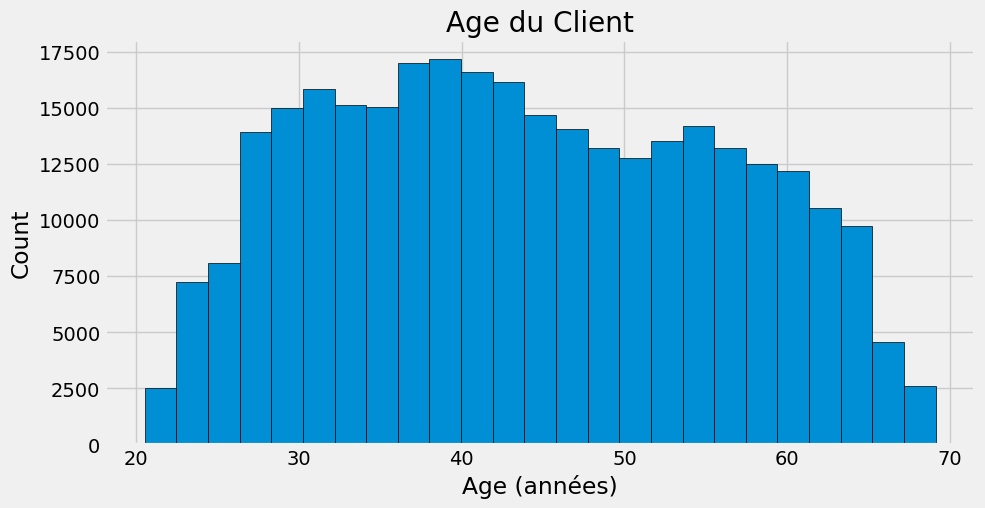

In [ ]:
# choix du style du tracé
plt.style.use('fivethirtyeight')

# Tracé de la distribution des ages
plt.figure(figsize=(10,5))
plt.hist(df_train['DAYS_BIRTH'] / 365, edgecolor = 'k', bins = 25)
plt.title('Age du Client'); plt.xlabel('Age (années)'); plt.ylabel('Count');


Les variables avec les plus fortes corrélations négatives sont les variables EXT.

Montrons les corrélations des caractéristiques EXT_SOURCE avec la cible et entre elles.

In [ ]:
# Créez le dataframe de corrélation
corr_data = df_train.corr()

# Créez un masque avec la même forme que le dataframe de corrélation
mask = np.triu(np.ones_like(corr_data, dtype=bool))
plt.figure(figsize=(100, 100))

# Utilisez le masque pour afficher la heatmap
sns.heatmap(corr_data, mask=mask, cmap=plt.cm.Spectral, square=True, vmin=-0.25, annot=True, vmax=0.6)
plt.title('Correlation Heatmap')
plt.show()

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.


In [ ]:
df_train.reset_index(drop=True, inplace=True)
df_test.reset_index(drop=True, inplace=True)


train = df_train.copy()
test = df_test.copy()

In [ ]:
#Récupération des identifiants clients et des labels
train_ids = train["SK_ID_CURR"]
test_ids = test["SK_ID_CURR"]

labels = train.TARGET

In [ ]:
features_set, test_features_set = clean_data(train,test)

Durée d'exécution de cat_encoder: 1.9726552963256836s
Training Data Shape:  (307500, 210)
Testing Data Shape:  (48744, 209)
Durée d'exécution de clean_data: 15.083826541900635s


In [ ]:
features_set = features_set.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '', x))
test_features_set = test_features_set.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '', x))

NameError: ignored

In [ ]:
test_feature_set_sample = test_features_set.sample(frac=0.2)

In [ ]:
test_features = test_features_set.reset_index()

In [ ]:
features_set.shape

(307500, 210)

In [ ]:
features_set

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,DAYS_EMPLOYED_ANOM,PROPORTION_LIFE_EMPLOYED,INCOME_TO_CREDIT_RATIO,INCOME_TO_ANNUITY_RATIO,INCOME_TO_ANNUITY_RATIO_BY_AGE,CREDIT_TO_ANNUITY_RATIO,CREDIT_TO_ANNUITY_RATIO_BY_AGE,INCOME_TO_FAMILYSIZE_RATIO,ANNUITY_INCOME_PERC,NAME_TYPE_SUITE_CHILDREN,NAME_TYPE_SUITE_FAMILY,NAME_TYPE_SUITE_GROUPOFPEOPLE,NAME_TYPE_SUITE_NAN,NAME_TYPE_SUITE_OTHER_A,NAME_TYPE_SUITE_OTHER_B,NAME_TYPE_SUITE_SPOUSEPARTNER,NAME_TYPE_SUITE_UNACCOMPANIED,NAME_TYPE_SUITE_nan,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercialassociate,NAME_INCOME_TYPE_Pensioner,NAME_INCOME_TYPE_Stateservant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_INCOME_TYPE_nan,NAME_EDUCATION_TYPE_Academicdegree,NAME_EDUCATION_TYPE_Highereducation,NAME_EDUCATION_TYPE_Incompletehigher,NAME_EDUCATION_TYPE_Lowersecondary,NAME_EDUCATION_TYPE_Secondarysecondaryspecial,NAME_EDUCATION_TYPE_nan,NAME_FAMILY_STATUS_CIVILMARRIAGE,NAME_FAMILY_STATUS_MARRIED,NAME_FAMILY_STATUS_SEPARATED,NAME_FAMILY_STATUS_SINGLENOTMARRIED,NAME_FAMILY_STATUS_WIDOW,NAME_FAMILY_STATUS_nan,NAME_HOUSING_TYPE_COOPAPARTMENT,NAME_HOUSING_TYPE_HOUSEAPARTMENT,NAME_HOUSING_TYPE_MUNICIPALAPARTMENT,NAME_HOUSING_TYPE_OFFICEAPARTMENT,NAME_HOUSING_TYPE_RENTEDAPARTMENT,NAME_HOUSING_TYPE_WITHPARENTS,NAME_HOUSING_TYPE_nan,OCCUPATION_TYPE_ACCOUNTANTS,OCCUPATION_TYPE_CLEANINGSTAFF,OCCUPATION_TYPE_COOKINGSTAFF,OCCUPATION_TYPE_CORESTAFF,OCCUPATION_TYPE_DRIVERS,OCCUPATION_TYPE_HIGHSKILLTECHSTAFF,OCCUPATION_TYPE_HRSTAFF,OCCUPATION_TYPE_ITSTAFF,OCCUPATION_TYPE_LABORERS,OCCUPATION_TYPE_LOWSKILLLABORERS,OCCUPATION_TYPE_MANAGERS,OCCUPATION_TYPE_MEDICINESTAFF,OCCUPATION_TYPE_NAN,OCCUPATION_TYPE_PRIVATESERVICESTAFF,OCCUPATION_TYPE_REALTYAGENTS,OCCUPATION_TYPE_SALESSTAFF,OCCUPATION_TYPE_SECRETARIES,OCCUPATION_TYPE_SECURITYSTAFF,OCCUPATION_TYPE_WAITERSBARMENSTAFF,OCCUPATION_TYPE_nan,WEEKDAY_APPR_PROCESS_START_FRIDAY,WEEKDAY_APPR_PROCESS_START_MONDAY,WEEKDAY_APPR_PROCESS_START_SATURDAY,WEEKDAY_APPR_PROCESS_START_SUNDAY,WEEKDAY_APPR_PROCESS_START_THURSDAY,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_WEDNESDAY,WEEKDAY_APPR_PROCESS_START_nan,ORGANIZATION_TYPE_Advertising,ORGANIZATION_TYPE_Agriculture,ORGANIZATION_TYPE_Bank,ORGANIZATION_TYPE_BusinessEntityType1,ORGANIZATION_TYPE_BusinessEntityType2,ORGANIZATION_TYPE_BusinessEntityType3,ORGANIZATION_TYPE_Cleaning,ORGANIZATION_TYPE_Construction,ORGANIZATION_TYPE_Culture,ORGANIZATION_TYPE_Electricity,ORGANIZATION_TYPE_Emergency,ORGANIZATION_TYPE_Government,ORGANIZATION_TYPE_Hotel,ORGANIZATION_TYPE_Housing,ORGANIZATION_TYPE_Industrytype1,ORGANIZATION_TYPE_Industrytype10,ORGANIZATION_TYPE_Industrytype11,ORGANIZATION_TYPE_Industrytype12,ORGANIZATION_TYPE_Industrytype13,ORGANIZATION_TYPE_Industrytype2,ORGANIZATION_TYPE_Industrytype3,ORGANIZATION_TYPE_Industrytype4,ORGANIZATION_TYPE_Industrytyp

In [ ]:
test_features

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,DAYS_EMPLOYED_ANOM,PROPORTION_LIFE_EMPLOYED,INCOME_TO_CREDIT_RATIO,INCOME_TO_ANNUITY_RATIO,INCOME_TO_ANNUITY_RATIO_BY_AGE,CREDIT_TO_ANNUITY_RATIO,CREDIT_TO_ANNUITY_RATIO_BY_AGE,INCOME_TO_FAMILYSIZE_RATIO,ANNUITY_INCOME_PERC,NAME_TYPE_SUITE_CHILDREN,NAME_TYPE_SUITE_FAMILY,NAME_TYPE_SUITE_GROUPOFPEOPLE,NAME_TYPE_SUITE_NAN,NAME_TYPE_SUITE_OTHER_A,NAME_TYPE_SUITE_OTHER_B,NAME_TYPE_SUITE_SPOUSEPARTNER,NAME_TYPE_SUITE_UNACCOMPANIED,NAME_TYPE_SUITE_nan,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercialassociate,NAME_INCOME_TYPE_Pensioner,NAME_INCOME_TYPE_Stateservant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_INCOME_TYPE_nan,NAME_EDUCATION_TYPE_Academicdegree,NAME_EDUCATION_TYPE_Highereducation,NAME_EDUCATION_TYPE_Incompletehigher,NAME_EDUCATION_TYPE_Lowersecondary,NAME_EDUCATION_TYPE_Secondarysecondaryspecial,NAME_EDUCATION_TYPE_nan,NAME_FAMILY_STATUS_CIVILMARRIAGE,NAME_FAMILY_STATUS_MARRIED,NAME_FAMILY_STATUS_SEPARATED,NAME_FAMILY_STATUS_SINGLENOTMARRIED,NAME_FAMILY_STATUS_WIDOW,NAME_FAMILY_STATUS_nan,NAME_HOUSING_TYPE_COOPAPARTMENT,NAME_HOUSING_TYPE_HOUSEAPARTMENT,NAME_HOUSING_TYPE_MUNICIPALAPARTMENT,NAME_HOUSING_TYPE_OFFICEAPARTMENT,NAME_HOUSING_TYPE_RENTEDAPARTMENT,NAME_HOUSING_TYPE_WITHPARENTS,NAME_HOUSING_TYPE_nan,OCCUPATION_TYPE_ACCOUNTANTS,OCCUPATION_TYPE_CLEANINGSTAFF,OCCUPATION_TYPE_COOKINGSTAFF,OCCUPATION_TYPE_CORESTAFF,OCCUPATION_TYPE_DRIVERS,OCCUPATION_TYPE_HIGHSKILLTECHSTAFF,OCCUPATION_TYPE_HRSTAFF,OCCUPATION_TYPE_ITSTAFF,OCCUPATION_TYPE_LABORERS,OCCUPATION_TYPE_LOWSKILLLABORERS,OCCUPATION_TYPE_MANAGERS,OCCUPATION_TYPE_MEDICINESTAFF,OCCUPATION_TYPE_NAN,OCCUPATION_TYPE_PRIVATESERVICESTAFF,OCCUPATION_TYPE_REALTYAGENTS,OCCUPATION_TYPE_SALESSTAFF,OCCUPATION_TYPE_SECRETARIES,OCCUPATION_TYPE_SECURITYSTAFF,OCCUPATION_TYPE_WAITERSBARMENSTAFF,OCCUPATION_TYPE_nan,WEEKDAY_APPR_PROCESS_START_FRIDAY,WEEKDAY_APPR_PROCESS_START_MONDAY,WEEKDAY_APPR_PROCESS_START_SATURDAY,WEEKDAY_APPR_PROCESS_START_SUNDAY,WEEKDAY_APPR_PROCESS_START_THURSDAY,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_WEDNESDAY,WEEKDAY_APPR_PROCESS_START_nan,ORGANIZATION_TYPE_Advertising,ORGANIZATION_TYPE_Agriculture,ORGANIZATION_TYPE_Bank,ORGANIZATION_TYPE_BusinessEntityType1,ORGANIZATION_TYPE_BusinessEntityType2,ORGANIZATION_TYPE_BusinessEntityType3,ORGANIZATION_TYPE_Cleaning,ORGANIZATION_TYPE_Construction,ORGANIZATION_TYPE_Culture,ORGANIZATION_TYPE_Electricity,ORGANIZATION_TYPE_Emergency,ORGANIZATION_TYPE_Government,ORGANIZATION_TYPE_Hotel,ORGANIZATION_TYPE_Housing,ORGANIZATION_TYPE_Industrytype1,ORGANIZATION_TYPE_Industrytype10,ORGANIZATION_TYPE_Industrytype11,ORGANIZATION_TYPE_Industrytype12,ORGANIZATION_TYPE_Industrytype13,ORGANIZATION_TYPE_Industrytype2,ORGANIZATION_TYPE_Industrytype3,ORGANIZATION_TYPE_Industrytype4,ORGANIZATION_TYPE_

In [ ]:
features_set.to_csv('/content/drive/MyDrive/Projet 7/features_set_reduit.csv', sep = ',')

In [ ]:
test_features.to_csv("/content/drive/MyDrive/Projet 7/test_preprocess_reduit.csv",sep = ',', index=False)

In [ ]:
features_set = pd.read_csv('/content/drive/MyDrive/Projet 7/features_set_reduit.csv', sep = ',')
features_set.set_index('SK_ID_CURR', inplace=True)
features_set

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,DAYS_EMPLOYED_ANOM,PROPORTION_LIFE_EMPLOYED,INCOME_TO_CREDIT_RATIO,INCOME_TO_ANNUITY_RATIO,INCOME_TO_ANNUITY_RATIO_BY_AGE,CREDIT_TO_ANNUITY_RATIO,CREDIT_TO_ANNUITY_RATIO_BY_AGE,INCOME_TO_FAMILYSIZE_RATIO,ANNUITY_INCOME_PERC,NAME_TYPE_SUITE_CHILDREN,NAME_TYPE_SUITE_FAMILY,NAME_TYPE_SUITE_GROUPOFPEOPLE,NAME_TYPE_SUITE_NAN,NAME_TYPE_SUITE_OTHER_A,NAME_TYPE_SUITE_OTHER_B,NAME_TYPE_SUITE_SPOUSEPARTNER,NAME_TYPE_SUITE_UNACCOMPANIED,NAME_TYPE_SUITE_nan,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercialassociate,NAME_INCOME_TYPE_Pensioner,NAME_INCOME_TYPE_Stateservant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_INCOME_TYPE_nan,NAME_EDUCATION_TYPE_Academicdegree,NAME_EDUCATION_TYPE_Highereducation,NAME_EDUCATION_TYPE_Incompletehigher,NAME_EDUCATION_TYPE_Lowersecondary,NAME_EDUCATION_TYPE_Secondarysecondaryspecial,NAME_EDUCATION_TYPE_nan,NAME_FAMILY_STATUS_CIVILMARRIAGE,NAME_FAMILY_STATUS_MARRIED,NAME_FAMILY_STATUS_SEPARATED,NAME_FAMILY_STATUS_SINGLENOTMARRIED,NAME_FAMILY_STATUS_WIDOW,NAME_FAMILY_STATUS_nan,NAME_HOUSING_TYPE_COOPAPARTMENT,NAME_HOUSING_TYPE_HOUSEAPARTMENT,NAME_HOUSING_TYPE_MUNICIPALAPARTMENT,NAME_HOUSING_TYPE_OFFICEAPARTMENT,NAME_HOUSING_TYPE_RENTEDAPARTMENT,NAME_HOUSING_TYPE_WITHPARENTS,NAME_HOUSING_TYPE_nan,OCCUPATION_TYPE_ACCOUNTANTS,OCCUPATION_TYPE_CLEANINGSTAFF,OCCUPATION_TYPE_COOKINGSTAFF,OCCUPATION_TYPE_CORESTAFF,OCCUPATION_TYPE_DRIVERS,OCCUPATION_TYPE_HIGHSKILLTECHSTAFF,OCCUPATION_TYPE_HRSTAFF,OCCUPATION_TYPE_ITSTAFF,OCCUPATION_TYPE_LABORERS,OCCUPATION_TYPE_LOWSKILLLABORERS,OCCUPATION_TYPE_MANAGERS,OCCUPATION_TYPE_MEDICINESTAFF,OCCUPATION_TYPE_NAN,OCCUPATION_TYPE_PRIVATESERVICESTAFF,OCCUPATION_TYPE_REALTYAGENTS,OCCUPATION_TYPE_SALESSTAFF,OCCUPATION_TYPE_SECRETARIES,OCCUPATION_TYPE_SECURITYSTAFF,OCCUPATION_TYPE_WAITERSBARMENSTAFF,OCCUPATION_TYPE_nan,WEEKDAY_APPR_PROCESS_START_FRIDAY,WEEKDAY_APPR_PROCESS_START_MONDAY,WEEKDAY_APPR_PROCESS_START_SATURDAY,WEEKDAY_APPR_PROCESS_START_SUNDAY,WEEKDAY_APPR_PROCESS_START_THURSDAY,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_WEDNESDAY,WEEKDAY_APPR_PROCESS_START_nan,ORGANIZATION_TYPE_Advertising,ORGANIZATION_TYPE_Agriculture,ORGANIZATION_TYPE_Bank,ORGANIZATION_TYPE_BusinessEntityType1,ORGANIZATION_TYPE_BusinessEntityType2,ORGANIZATION_TYPE_BusinessEntityType3,ORGANIZATION_TYPE_Cleaning,ORGANIZATION_TYPE_Construction,ORGANIZATION_TYPE_Culture,ORGANIZATION_TYPE_Electricity,ORGANIZATION_TYPE_Emergency,ORGANIZATION_TYPE_Government,ORGANIZATION_TYPE_Hotel,ORGANIZATION_TYPE_Housing,ORGANIZATION_TYPE_Industrytype1,ORGANIZATION_TYPE_Industrytype10,ORGANIZATION_TYPE_Industrytype11,ORGANIZATION_TYPE_Industrytype12,ORGANIZATION_TYPE_Industrytype13,ORGANIZATION_TYPE_Industrytype2,ORGANIZATION_TYPE_Industrytype3,ORGANIZATION_TYPE_Industrytype4,ORGANIZATION_TYPE_Industrytyp

In [ ]:
test_features = pd.read_csv('/content/drive/MyDrive/Projet 7/test_preprocess_reduit.csv', sep = ',')
test_features

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,DAYS_EMPLOYED_ANOM,PROPORTION_LIFE_EMPLOYED,INCOME_TO_CREDIT_RATIO,INCOME_TO_ANNUITY_RATIO,INCOME_TO_ANNUITY_RATIO_BY_AGE,CREDIT_TO_ANNUITY_RATIO,CREDIT_TO_ANNUITY_RATIO_BY_AGE,INCOME_TO_FAMILYSIZE_RATIO,ANNUITY_INCOME_PERC,NAME_TYPE_SUITE_CHILDREN,NAME_TYPE_SUITE_FAMILY,NAME_TYPE_SUITE_GROUPOFPEOPLE,NAME_TYPE_SUITE_NAN,NAME_TYPE_SUITE_OTHER_A,NAME_TYPE_SUITE_OTHER_B,NAME_TYPE_SUITE_SPOUSEPARTNER,NAME_TYPE_SUITE_UNACCOMPANIED,NAME_TYPE_SUITE_nan,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercialassociate,NAME_INCOME_TYPE_Pensioner,NAME_INCOME_TYPE_Stateservant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_INCOME_TYPE_nan,NAME_EDUCATION_TYPE_Academicdegree,NAME_EDUCATION_TYPE_Highereducation,NAME_EDUCATION_TYPE_Incompletehigher,NAME_EDUCATION_TYPE_Lowersecondary,NAME_EDUCATION_TYPE_Secondarysecondaryspecial,NAME_EDUCATION_TYPE_nan,NAME_FAMILY_STATUS_CIVILMARRIAGE,NAME_FAMILY_STATUS_MARRIED,NAME_FAMILY_STATUS_SEPARATED,NAME_FAMILY_STATUS_SINGLENOTMARRIED,NAME_FAMILY_STATUS_WIDOW,NAME_FAMILY_STATUS_nan,NAME_HOUSING_TYPE_COOPAPARTMENT,NAME_HOUSING_TYPE_HOUSEAPARTMENT,NAME_HOUSING_TYPE_MUNICIPALAPARTMENT,NAME_HOUSING_TYPE_OFFICEAPARTMENT,NAME_HOUSING_TYPE_RENTEDAPARTMENT,NAME_HOUSING_TYPE_WITHPARENTS,NAME_HOUSING_TYPE_nan,OCCUPATION_TYPE_ACCOUNTANTS,OCCUPATION_TYPE_CLEANINGSTAFF,OCCUPATION_TYPE_COOKINGSTAFF,OCCUPATION_TYPE_CORESTAFF,OCCUPATION_TYPE_DRIVERS,OCCUPATION_TYPE_HIGHSKILLTECHSTAFF,OCCUPATION_TYPE_HRSTAFF,OCCUPATION_TYPE_ITSTAFF,OCCUPATION_TYPE_LABORERS,OCCUPATION_TYPE_LOWSKILLLABORERS,OCCUPATION_TYPE_MANAGERS,OCCUPATION_TYPE_MEDICINESTAFF,OCCUPATION_TYPE_NAN,OCCUPATION_TYPE_PRIVATESERVICESTAFF,OCCUPATION_TYPE_REALTYAGENTS,OCCUPATION_TYPE_SALESSTAFF,OCCUPATION_TYPE_SECRETARIES,OCCUPATION_TYPE_SECURITYSTAFF,OCCUPATION_TYPE_WAITERSBARMENSTAFF,OCCUPATION_TYPE_nan,WEEKDAY_APPR_PROCESS_START_FRIDAY,WEEKDAY_APPR_PROCESS_START_MONDAY,WEEKDAY_APPR_PROCESS_START_SATURDAY,WEEKDAY_APPR_PROCESS_START_SUNDAY,WEEKDAY_APPR_PROCESS_START_THURSDAY,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_WEDNESDAY,WEEKDAY_APPR_PROCESS_START_nan,ORGANIZATION_TYPE_Advertising,ORGANIZATION_TYPE_Agriculture,ORGANIZATION_TYPE_Bank,ORGANIZATION_TYPE_BusinessEntityType1,ORGANIZATION_TYPE_BusinessEntityType2,ORGANIZATION_TYPE_BusinessEntityType3,ORGANIZATION_TYPE_Cleaning,ORGANIZATION_TYPE_Construction,ORGANIZATION_TYPE_Culture,ORGANIZATION_TYPE_Electricity,ORGANIZATION_TYPE_Emergency,ORGANIZATION_TYPE_Government,ORGANIZATION_TYPE_Hotel,ORGANIZATION_TYPE_Housing,ORGANIZATION_TYPE_Industrytype1,ORGANIZATION_TYPE_Industrytype10,ORGANIZATION_TYPE_Industrytype11,ORGANIZATION_TYPE_Industrytype12,ORGANIZATION_TYPE_Industrytype13,ORGANIZATION_TYPE_Industrytype2,ORGANIZATION_TYPE_Industrytype3,ORGANIZATION_TYPE_Industrytype4,ORGANIZATION_TYPE_

## Modélisation

In [26]:
seed = 42

In [ ]:
df_X = features_set.drop(columns = 'TARGET')
df_y = features_set['TARGET']
train_set, val_set, train_labels, val_labels = echantillonage(df_X,df_y)

Durée d'exécution de echantillonage: 0.6798763275146484s


In [ ]:
train_set['TARGET']=train_labels
val_set['TARGET']=val_labels

In [ ]:
train_set = train_set.reset_index()

In [ ]:
sample_X = features_set.drop(columns = 'TARGET').sample(n= 10000, random_state=seed)
sample_y = features_set['TARGET'][sample_X.index]

train_sample_set, val_sample_set, train_sample_labels, val_sample_labels = echantillonage(sample_X,sample_y)

Durée d'exécution de echantillonage: 0.011787891387939453s


In [ ]:
index_sample = sample_X.index

In [ ]:
train_sample_set['TARGET']=train_sample_labels
val_sample_set['TARGET']=val_sample_labels


train_sample_set = train_sample_set.reset_index()

In [ ]:
print('train shape :',train_set.shape)
print('validation shape :',val_set.shape)


print('train sample shape :',train_sample_set.shape)
print('validation sample shape :',val_sample_set.shape)

train shape : (246000, 211)
validation shape : (61500, 210)
train sample shape : (8000, 211)
validation sample shape : (2000, 210)


In [ ]:
#sauvegarde des train set et val set
pickle.dump( train_set, open( "/content/drive/MyDrive/Projet 7/train_set.p", "wb" ) )
pickle.dump( val_set, open( "/content/drive/MyDrive/Projet 7/val_set.p", "wb" ) )
pickle.dump( train_labels, open( "/content/drive/MyDrive/Projet 7/train_labels.p", "wb" ) )
pickle.dump( val_labels, open( "/content/drive/MyDrive/Projet 7/val_labels.p", "wb" ) )

In [ ]:
pickle.dump( train_sample_set, open( "/content/drive/MyDrive/Projet 7/train_sample_set.p", "wb" ) )
pickle.dump( val_sample_set, open( "/content/drive/MyDrive/Projet 7/val_sample_set.p", "wb" ) )

pickle.dump( train_sample_labels, open( "/content/drive/MyDrive/Projet 7/train_sample_labels.p", "wb" ) )
pickle.dump( val_sample_labels, open( "/content/drive/MyDrive/Projet 7/val_sample_labels.p", "wb" ) )

In [23]:
#chargement des train set et val set
train_set = pickle.load( open( "/content/drive/MyDrive/Projet 7/train_set.p", "rb" ) )
val_set = pickle.load( open( "/content/drive/MyDrive/Projet 7/val_set.p", "rb" ) )
train_labels = pickle.load( open( "/content/drive/MyDrive/Projet 7/train_labels.p", "rb" ) )
val_labels = pickle.load( open( "/content/drive/MyDrive/Projet 7/val_labels.p", "rb" ) )


In [24]:
train_sample_set = pickle.load( open( "/content/drive/MyDrive/Projet 7/train_sample_set.p", "rb" ) )
val_sample_set = pickle.load( open( "/content/drive/MyDrive/Projet 7/val_sample_set.p", "rb" ) )
train_sample_labels = pickle.load( open( "/content/drive/MyDrive/Projet 7/train_sample_labels.p", "rb" ) )
val_sample_labels = pickle.load( open( "/content/drive/MyDrive/Projet 7/val_sample_labels.p", "rb" ) )

In [ ]:
from sklearn.ensemble import AdaBoostClassifier

## MLFLOW

In [ ]:

!pip install mlflow

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 19.0/19.0 MB 59.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 150.3/150.3 kB 16.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.6/190.6 kB 22.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 226.8/226.8 kB 27.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 148.1/148.1 kB 20.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.2/80.2 kB 10.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 9.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 7.1 MB/s eta 0:00:00


In [ ]:
import mlflow
# Définition d'une expérience (Une expérience peut contenir plusieurs *runs*)
mlflow.set_experiment("LGBMClassifier")
mlflow.sklearn.autolog() # Ici on fait appel à l'API MLflow qui intégre les algos de Scikit-Learn.
                        # C'est grâce à ce code qu'on enregistre toutes les métriques et métadonnées de cette expérience (Module MLflow Tracking)
with mlflow.start_run(run_name = 'LGBMClassifier_defaut'):
  clf = lgb.LGBMClassifier()
  clf.fit(train_sample_set, train_sample_labels)

[LightGBM] [Info] Number of positive: 3226, number of negative: 36774
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007601 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5514
[LightGBM] [Info] Number of data points in the train set: 40000, number of used features: 182
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.080650 -> initscore=-2.433548
[LightGBM] [Info] Start training from score -2.433548
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

In [ ]:
# Création d'un second run dans la même expérience
with mlflow.start_run(run_name='LGBMClassifier_param'):
    clf2 = lgb.LGBMClassifier(
        colsample_bytree=0.6000000000000001,
        learning_rate=0.031103270575433,
        max_depth=12,
        n_estimators=600,
        num_leaves=60,
        reg_alpha=0.8,
        reg_lambda=0.7000000000000001,
        seuil=0.55,
        subsample=0.2
    )
    clf2.fit(train_sample_set, train_sample_labels)

[LightGBM] [Warning] Unknown parameter: seuil
[LightGBM] [Warning] Unknown parameter: seuil
[LightGBM] [Info] Number of positive: 3226, number of negative: 36774
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011101 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5514
[LightGBM] [Info] Number of data points in the train set: 40000, number of used features: 182
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.080650 -> initscore=-2.433548
[LightGBM] [Info] Start training from score -2.433548
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

In [ ]:
!pip install pyngrok

In [ ]:
# Prédictions
logged_model = 'runs:/12366ea03957424891b6f90e65086664/model'

# Load model as a PyFuncModel.
loaded_model = mlflow.pyfunc.load_model(logged_model)

# Predict on a Pandas DataFrame.
import pandas as pd
prediction = loaded_model.predict(new_data)
prediction

In [ ]:
from pyngrok import ngrok
# Terminate open tunnels if exist
ngrok.kill()

# Setting the authtoken (optional)
# Get your authtoken from https://dashboard.ngrok.com/auth
NGROK_AUTH_TOKEN = "2YGm2G54kBEMvnAj43IFcf4QK1O_7kd3J9UnbA4TGcvw9W5Np"
ngrok.set_auth_token(NGROK_AUTH_TOKEN)

# Open an HTTPs tunnel on port 5000 for http://localhost:5000
ngrok_tunnel = ngrok.connect(addr="5000", proto="http", bind_tls=True)
print("MLflow Tracking UI:", ngrok_tunnel.public_url)

MLflow Tracking UI: https://c4a0-34-90-222-111.ngrok-free.app


In [ ]:
!mlflow ui

[2023-11-17 08:42:57 +0000] [207298] [INFO] Starting gunicorn 21.2.0
[2023-11-17 08:42:57 +0000] [207298] [INFO] Listening at: http://127.0.0.1:5000 (207298)
[2023-11-17 08:42:57 +0000] [207298] [INFO] Using worker: sync
[2023-11-17 08:42:57 +0000] [207299] [INFO] Booting worker with pid: 207299
[2023-11-17 08:42:57 +0000] [207300] [INFO] Booting worker with pid: 207300
[2023-11-17 08:42:57 +0000] [207301] [INFO] Booting worker with pid: 207301
[2023-11-17 08:42:57 +0000] [207302] [INFO] Booting worker with pid: 207302

[2023-11-17 08:51:38 +0000] [207298] [INFO] Handling signal: int
Aborted!
[2023-11-17 08:51:38 +0000] [207302] [INFO] Worker exiting (pid: 207302)
[2023-11-17 08:51:38 +0000] [207300] [INFO] Worker exiting (pid: 207300)
[2023-11-17 08:51:38 +0000] [207301] [INFO] Worker exiting (pid: 207301)
[2023-11-17 08:51:38 +0000] [207299] [INFO] Worker exiting (pid: 207299)
[2023-11-17 08:51:39 +0000] [207298] [INFO] Shutting down: Master


In [ ]:
#
# Dictionnaire de classifieurs
classifieurs = { 'Dummy Classifier': DummyClassifier(),
                  'Logistic Regression': LogisticRegression(solver='lbfgs', max_iter=1000),
                  'AdaBoost' : AdaBoostClassifier() ,
                      'LGBM': lgb.LGBMClassifier()

                 }

2023/11/17 10:27:51 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '9029e86d1cdf441dabfb2f37838a3918', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current sklearn workflow


Dummy Classifier


2023/11/17 10:27:51 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/usr/local/lib/python3.10/dist-packages/mlflow/data/pandas_dataset.py:134: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details."
Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
2023/11/17 10:

Logistic Regression


2023/11/17 10:28:08 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/usr/local/lib/python3.10/dist-packages/mlflow/data/pandas_dataset.py:134: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details."
Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
2023/11/17 10:

AdaBoost


2023/11/17 10:28:26 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/usr/local/lib/python3.10/dist-packages/mlflow/data/pandas_dataset.py:134: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details."
2023/11/17 10:28:34 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/usr/local/lib/python3.10/dist-packages/mlflow/mod

LGBM
[LightGBM] [Info] Number of positive: 2516, number of negative: 29484
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006776 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5490
[LightGBM] [Info] Number of data points in the train set: 32000, number of used features: 179
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.078625 -> initscore=-2.461177
[LightGBM] [Info] Start training from score -2.461177
[LightGBM] [Info] Number of positive: 2577, number of negative: 29423
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006084 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5503
[LightGBM] [Info] Number of data points in the train set: 32000, number of used features: 178
[LightGBM] [I

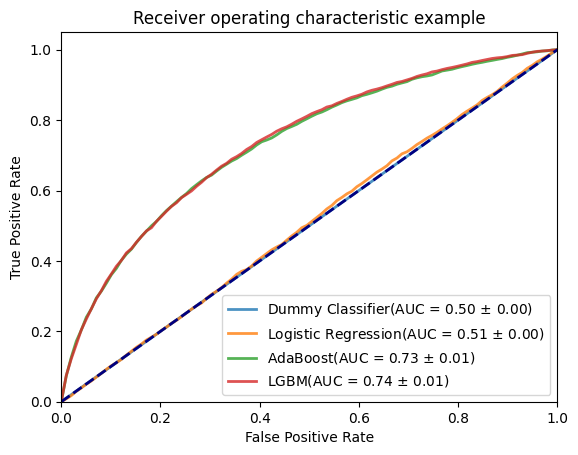

Durée d'exécution de plot_roc_curve: 91.84620881080627s


In [ ]:
plot_roc_curve(classifieurs,train_sample_set.drop(columns = 'TARGET'),train_sample_labels, n_splits = 5)

## Rééquilibrage et choix du modèle

In [ ]:
best_par_0, feat_imp_0, model_0 = optimisation_model(train_sample_set, lgb.LGBMClassifier(random_state=seed),metric = cout_metier, n_ite_baye=5)

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No fur

### Best parametres

In [28]:
best_par_0

{'colsample_by_tree': 0.7000000000000001,
 'learning_rate': 0.0050786990236255354,
 'max_depth': 14.0,
 'n_estimators': 400.0,
 'num_leaves': 32.0,
 'reg_alpha': 0.4,
 'reg_lambda': 0.5,
 'seuil': 0.9750000000000001,
 'subsample': 0.8}

### Metrics vs Threshold

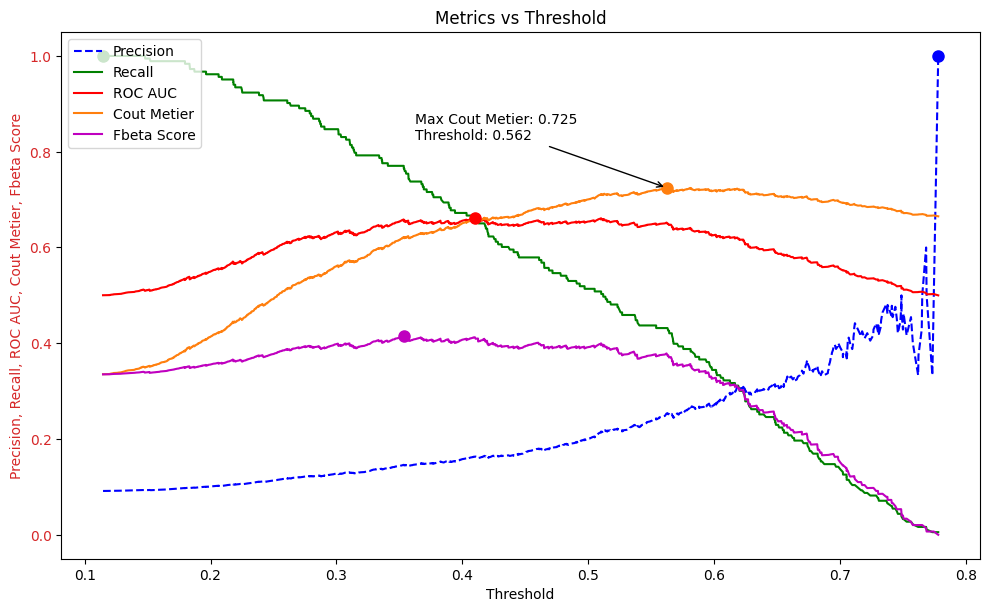

In [29]:
from sklearn.metrics import precision_recall_curve, roc_auc_score, confusion_matrix
from sklearn.metrics import roc_auc_score, recall_score, f1_score, precision_score, fbeta_score


# Assuming X_train is your training features, y_train is your training labels, and model_smote is your trained model
# Metrics to visualize
metrics_to_visualize = [roc_auc_score, recall_score, f1_score, precision_score, fbeta_score]


# Function to calculate metrics at different thresholds
def calculate_metrics(X, y, model):
    y_pred_proba = model.predict_proba(X)[:, 1]
    precision, recall, thresholds = precision_recall_curve(y, y_pred_proba)
    roc_auc = [roc_auc_score(y, y_pred_proba > threshold) for threshold in thresholds]
    cout_metier_values = [cout_metier(y, y_pred_proba > threshold) for threshold in thresholds]
    fbeta_scores = [fbeta_score(y, y_pred_proba > threshold, beta=2) for threshold in thresholds]

    return thresholds, precision, recall, roc_auc, cout_metier_values, fbeta_scores

# Function to plot metrics vs threshold
def plot_metrics_vs_threshold(X, y, model, metrics_to_visualize):
    fig, ax1 = plt.subplots(figsize=(10, 6))

    thresholds, precision, recall, roc_auc, cout_metier_values, fbeta_scores = calculate_metrics(X, y, model)

    ax1.set_xlabel('Threshold')
    ax1.set_ylabel('Precision, Recall, ROC AUC, Cout Metier, Fbeta Score', color='tab:red')
    ax1.plot(thresholds, precision[:-1], 'b--', label='Precision')
    ax1.plot(thresholds, recall[:-1], 'g-', label='Recall')
    ax1.plot(thresholds, roc_auc, 'r-', label='ROC AUC')
    ax1.plot(thresholds, cout_metier_values, 'tab:orange', label='Cout Metier')
    ax1.plot(thresholds, fbeta_scores, 'm-', label='Fbeta Score')
    ax1.tick_params(axis='y', labelcolor='tab:red')

    # Add legend
    ax1.legend(loc='upper left')

    # Mark maximum values
    max_precision_idx = np.argmax(precision[:-1])
    max_recall_idx = np.argmax(recall[:-1])
    max_roc_auc_idx = np.argmax(roc_auc)
    max_cout_metier_idx = np.argmax(cout_metier_values)
    max_fbeta_score_idx = np.argmax(fbeta_scores)

    ax1.plot(thresholds[max_precision_idx], precision[:-1][max_precision_idx], 'bo', markersize=8, label='Max Precision')
    ax1.plot(thresholds[max_recall_idx], recall[:-1][max_recall_idx], 'go', markersize=8, label='Max Recall')
    ax1.plot(thresholds[max_roc_auc_idx], roc_auc[max_roc_auc_idx], 'ro', markersize=8, label='Max ROC AUC')
    ax1.plot(thresholds[max_cout_metier_idx], cout_metier_values[max_cout_metier_idx], 'o', color='tab:orange', markersize=8, label='Max Cout Metier: {:.3f} (Threshold: {:.3f})'.format(cout_metier_values[max_cout_metier_idx], thresholds[max_cout_metier_idx]))
    ax1.plot(thresholds[max_fbeta_score_idx], fbeta_scores[max_fbeta_score_idx], 'mo', markersize=8, label='Max Fbeta Score: {:.3f} (Threshold: {:.3f})'.format(fbeta_scores[max_fbeta_score_idx], thresholds[max_fbeta_score_idx]))

    # Annotate the maximum Cout Metier value
    ax1.annotate(
        f'Max Cout Metier: {cout_metier_values[max_cout_metier_idx]:.3f}\nThreshold: {thresholds[max_cout_metier_idx]:.3f}',
        xy=(thresholds[max_cout_metier_idx], cout_metier_values[max_cout_metier_idx]),
        xytext=(thresholds[max_cout_metier_idx] - 0.2, cout_metier_values[max_cout_metier_idx] + 0.1),
        arrowprops=dict(facecolor='black', arrowstyle='->'),
    )

    fig.tight_layout()
    plt.title('Metrics vs Threshold')
    plt.show()

# usage
plot_metrics_vs_threshold(val_sample_set.drop(columns=['TARGET']), val_sample_labels, model_0, metrics_to_visualize)


### Metrics

In [30]:
from sklearn.metrics import roc_auc_score, recall_score, precision_score, f1_score
y_proba = model_0.predict_proba(val_sample_set.drop(columns = ['TARGET']))[:, 1]
y_pred_proba = y_proba > 0.562
y_pred_proba = np.array(y_pred_proba > 0)*1

# Si proba > seuil alors la prédiction est positive : 1
score= roc_auc_score(val_sample_labels,y_proba)

# recall
recall = recall_score(val_sample_labels,y_pred_proba)


# precision
precision = precision_score(val_sample_labels, y_pred_proba)

# F1
f1 = f1_score(val_sample_labels, y_pred_proba)

#Fbeta
fbeta = fbeta_score(val_sample_labels, y_pred_proba, beta=2)

print("ROC auc score : ", score)
print("Métrique métier : ", cout_metier(val_sample_labels, y_pred_proba))
print("Rappel (recall):", recall)
print("Précision :", precision)
print("F1-score :", f1)
print("Fbeta-score  :", fbeta)

ROC auc score :  0.7189446364180433
Métrique métier :  0.7243777452415813
Rappel (recall): 0.43169398907103823
Précision : 0.2532051282051282
F1-score : 0.31919191919191914
Fbeta-score  : 0.3783524904214559


### Lift Curve

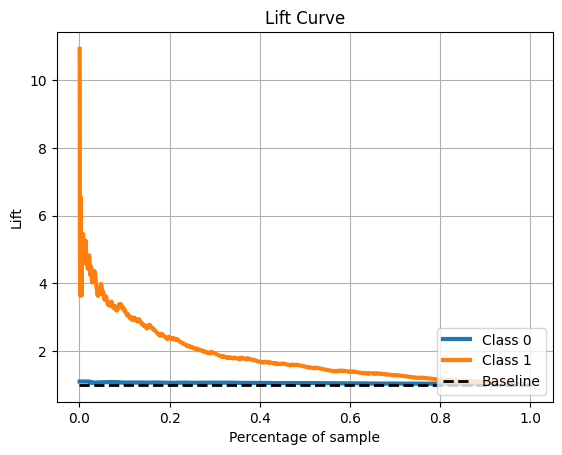

In [31]:
# Assuming model_us is your classifier and val_sample_set is your validation dataset
y_proba = model_0.predict_proba(val_sample_set.drop(columns=['TARGET']))
skplt.metrics.plot_lift_curve(val_sample_labels, y_proba)
plt.show()

#skplt.metrics.plot_lift_curve(val_sample_labels, model_us.predict_proba(val_sample_set.drop(columns = ['TARGET'])))[:,1]
plt.show()

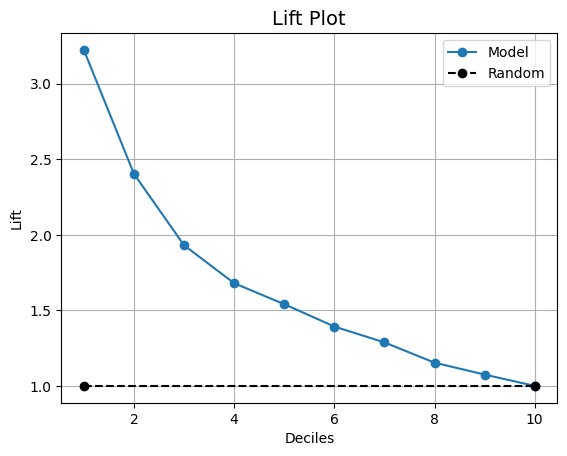

In [32]:
# Assuming model_us is your classifier and val_sample_set is your validation dataset
y_proba = model_0.predict_proba(val_sample_set.drop(columns=['TARGET']))[:, 1]

# Use kds.metrics.plot_lift instead of scikitplot
kds.metrics.plot_lift(val_sample_labels, y_proba)
plt.show()

### Matrice de confusion

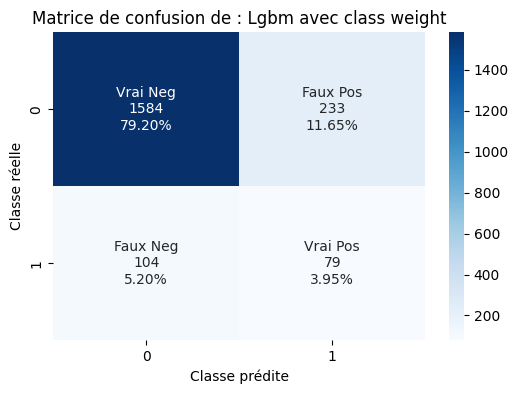

Durée d'exécution de afficher_matrice_confusion: 0.18666911125183105s


In [33]:
afficher_matrice_confusion(val_sample_labels,y_pred_proba, "Lgbm avec class weight")

In [34]:
save_folder = '/content/drive/MyDrive/Projet 7/'
with open(os.path.join(save_folder, 'best_par_0.pkl'), 'wb') as f:
    pickle.dump(best_par_0, f)

with open(os.path.join(save_folder, 'feat_imp_0.pkl'), 'wb') as f:
    pickle.dump(feat_imp_0, f)

with open(os.path.join(save_folder, 'model_0.pkl'), 'wb') as f:
    pickle.dump(model_0, f)


In [35]:
best_par_0 = pickle.load(open("/content/drive/MyDrive/Projet 7/best_par_0.pkl", "rb"))
feat_imp_0 = pickle.load(open("/content/drive/MyDrive/Projet 7/feat_imp_0.pkl", "rb"))
model_0 = pickle.load(open("/content/drive/MyDrive/Projet 7/model_0.pkl", "rb"))

## Smote

In [ ]:
best_par_smote, feat_imp_smote, model_smote = optimisation_model(train_sample_set, lgb.LGBMClassifier(random_state=seed),metric = cout_metier,smote = True, n_ite_baye=5)

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No fur

### Best parameters

In [ ]:
best_par_smote

{'colsample_by_tree': 0.7000000000000001,
 'learning_rate': 0.012673057820681774,
 'max_depth': 4.0,
 'n_estimators': 600.0,
 'num_leaves': 8.0,
 'reg_alpha': 0.4,
 'reg_lambda': 0.7000000000000001,
 'seuil': 0.75,
 'subsample': 0.2}

### Metrics vs Threshold

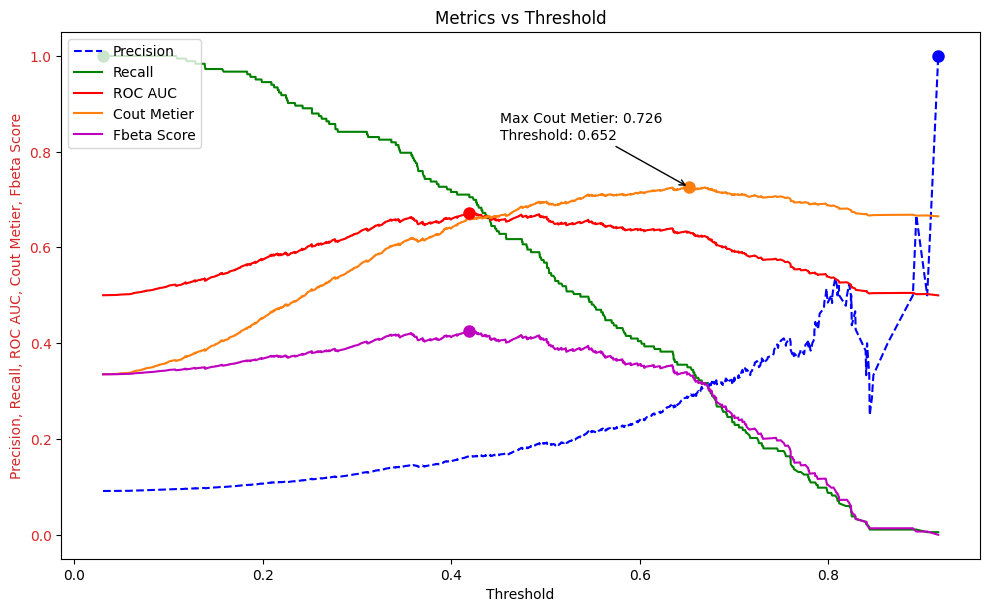

In [ ]:
from sklearn.metrics import precision_recall_curve, roc_auc_score, confusion_matrix
from sklearn.metrics import roc_auc_score, recall_score, f1_score, precision_score, fbeta_score


# Assuming X_train is your training features, y_train is your training labels, and model_smote is your trained model
# Metrics to visualize
metrics_to_visualize = [roc_auc_score, recall_score, f1_score, precision_score, fbeta_score]


# Function to calculate metrics at different thresholds
def calculate_metrics(X, y, model):
    y_pred_proba = model.predict_proba(X)[:, 1]
    precision, recall, thresholds = precision_recall_curve(y, y_pred_proba)
    roc_auc = [roc_auc_score(y, y_pred_proba > threshold) for threshold in thresholds]
    cout_metier_values = [cout_metier(y, y_pred_proba > threshold) for threshold in thresholds]
    fbeta_scores = [fbeta_score(y, y_pred_proba > threshold, beta=2) for threshold in thresholds]

    return thresholds, precision, recall, roc_auc, cout_metier_values, fbeta_scores

# Function to plot metrics vs threshold
def plot_metrics_vs_threshold(X, y, model, metrics_to_visualize):
    fig, ax1 = plt.subplots(figsize=(10, 6))

    thresholds, precision, recall, roc_auc, cout_metier_values, fbeta_scores = calculate_metrics(X, y, model)

    ax1.set_xlabel('Threshold')
    ax1.set_ylabel('Precision, Recall, ROC AUC, Cout Metier, Fbeta Score', color='tab:red')
    ax1.plot(thresholds, precision[:-1], 'b--', label='Precision')
    ax1.plot(thresholds, recall[:-1], 'g-', label='Recall')
    ax1.plot(thresholds, roc_auc, 'r-', label='ROC AUC')
    ax1.plot(thresholds, cout_metier_values, 'tab:orange', label='Cout Metier')
    ax1.plot(thresholds, fbeta_scores, 'm-', label='Fbeta Score')
    ax1.tick_params(axis='y', labelcolor='tab:red')

    # Add legend
    ax1.legend(loc='upper left')

    # Mark maximum values
    max_precision_idx = np.argmax(precision[:-1])
    max_recall_idx = np.argmax(recall[:-1])
    max_roc_auc_idx = np.argmax(roc_auc)
    max_cout_metier_idx = np.argmax(cout_metier_values)
    max_fbeta_score_idx = np.argmax(fbeta_scores)

    ax1.plot(thresholds[max_precision_idx], precision[:-1][max_precision_idx], 'bo', markersize=8, label='Max Precision')
    ax1.plot(thresholds[max_recall_idx], recall[:-1][max_recall_idx], 'go', markersize=8, label='Max Recall')
    ax1.plot(thresholds[max_roc_auc_idx], roc_auc[max_roc_auc_idx], 'ro', markersize=8, label='Max ROC AUC')
    ax1.plot(thresholds[max_cout_metier_idx], cout_metier_values[max_cout_metier_idx], 'o', color='tab:orange', markersize=8, label='Max Cout Metier: {:.3f} (Threshold: {:.3f})'.format(cout_metier_values[max_cout_metier_idx], thresholds[max_cout_metier_idx]))
    ax1.plot(thresholds[max_fbeta_score_idx], fbeta_scores[max_fbeta_score_idx], 'mo', markersize=8, label='Max Fbeta Score: {:.3f} (Threshold: {:.3f})'.format(fbeta_scores[max_fbeta_score_idx], thresholds[max_fbeta_score_idx]))

    # Annotate the maximum Cout Metier value
    ax1.annotate(
        f'Max Cout Metier: {cout_metier_values[max_cout_metier_idx]:.3f}\nThreshold: {thresholds[max_cout_metier_idx]:.3f}',
        xy=(thresholds[max_cout_metier_idx], cout_metier_values[max_cout_metier_idx]),
        xytext=(thresholds[max_cout_metier_idx] - 0.2, cout_metier_values[max_cout_metier_idx] + 0.1),
        arrowprops=dict(facecolor='black', arrowstyle='->'),
    )

    fig.tight_layout()
    plt.title('Metrics vs Threshold')
    plt.show()

# usage
plot_metrics_vs_threshold(val_sample_set.drop(columns=['TARGET']), val_sample_labels, model_smote, metrics_to_visualize)


### Metrics

In [165]:
y_proba_smote = model_smote.predict_proba(val_sample_set.drop(columns = ['TARGET']))[:, 1]
y_pred_proba_smote = y_proba_smote > 0.65
y_pred_proba_smote = np.array(y_pred_proba_smote > 0)*1

# Si proba > seuil alors la prédiction est positive : 1
score_smote= roc_auc_score(val_sample_labels,y_proba_smote)

# Recall
recall_smote = recall_score(val_sample_labels,y_pred_proba_smote)

# precision
precision_smote = precision_score(val_sample_labels, y_pred_proba_smote)

# F1
f1_smote = f1_score(val_sample_labels, y_pred_proba_smote)

#Fbeta
fbeta_smote = fbeta_score(val_sample_labels, y_pred_proba_smote, beta=2)

print ("ROC auc score : ",score_smote)
print("métrique métier : ",cout_metier(val_sample_labels,y_pred_proba_smote))
print("Rappel (recall):", recall_smote)
print("Précision :", precision_smote)
print("F1-score :", f1_smote)
print("Fbeta-score  :", fbeta_smote)


ROC auc score :  0.7249925566372241
métrique métier :  0.7251098096632503
Rappel (recall): 0.3551912568306011
Précision : 0.28761061946902655
F1-score : 0.3178484107579462
Fbeta-score  : 0.3392484342379959


### Lift Curve

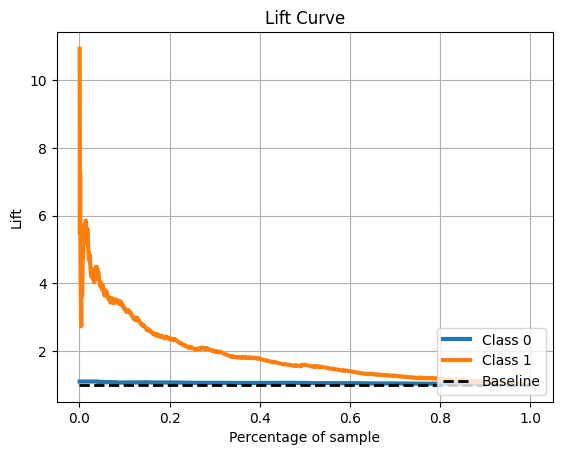

In [ ]:

import scikitplot as skplt
# Assuming model_us is your classifier and val_sample_set is your validation dataset
y_proba = model_smote.predict_proba(val_sample_set.drop(columns=['TARGET']))
skplt.metrics.plot_lift_curve(val_sample_labels, y_proba)
plt.show()

#skplt.metrics.plot_lift_curve(val_sample_labels, model_us.predict_proba(val_sample_set.drop(columns = ['TARGET'])))[:,1]
plt.show()

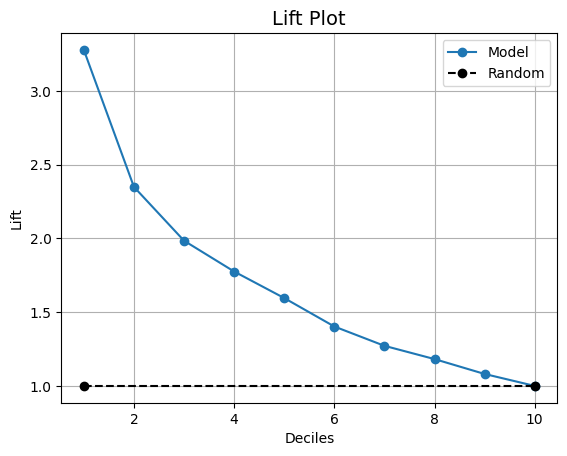

In [ ]:
import kds

# Assuming model_us is your classifier and val_sample_set is your validation dataset
y_proba = model_smote.predict_proba(val_sample_set.drop(columns=['TARGET']))[:, 1]

# Use kds.metrics.plot_lift instead of scikitplot
kds.metrics.plot_lift(val_sample_labels, y_proba)
plt.show()

### Martice de confusion

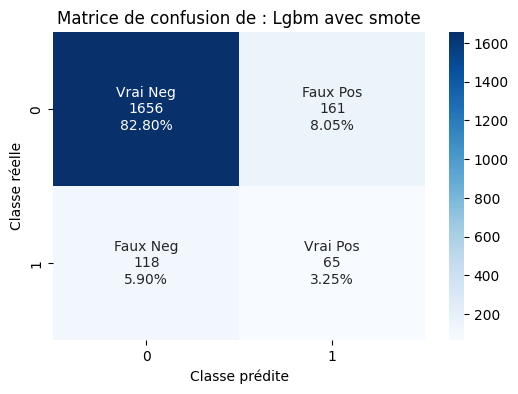

Durée d'exécution de afficher_matrice_confusion: 0.18108654022216797s


In [ ]:
afficher_matrice_confusion(val_sample_labels,y_pred_proba_smote, "Lgbm avec smote")

In [ ]:
save_folder = '/content/drive/MyDrive/Projet 7/'
with open(os.path.join(save_folder, 'best_par_smote.pkl'), 'wb') as f:
    pickle.dump(best_par_smote, f)

with open(os.path.join(save_folder, 'feat_imp_smote.pkl'), 'wb') as f:
    pickle.dump(feat_imp_smote, f)

with open(os.path.join(save_folder, 'model_smote.pkl'), 'wb') as f:
    pickle.dump(model_smote, f)


In [ ]:
best_par_smote = pickle.load(open("/content/drive/MyDrive/Projet 7/best_par_smote.pkl", "rb"))
feat_imp_smote = pickle.load(open("/content/drive/MyDrive/Projet 7/feat_imp_smote.pkl", "rb"))
model_smote = pickle.load(open("/content/drive/MyDrive/Projet 7/model_smote.pkl", "rb"))

## UnderSampling

In [ ]:
best_parameters_us, feature_importance_us, model_us = optimisation_model(train_sample_set, lgb.LGBMClassifier(random_state=42),
                                                                             metric=cout_metier, under=True,
                                                                             n_ite_baye=5
                                                                             )

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] N

###Best parameters

In [ ]:
best_parameters_us

{'colsample_by_tree': 0.8,
 'learning_rate': 0.005835477453591743,
 'max_depth': 20.0,
 'n_estimators': 400.0,
 'num_leaves': 84.0,
 'reg_alpha': 0.7000000000000001,
 'reg_lambda': 0.30000000000000004,
 'seuil': 0.9750000000000001,
 'subsample': 0.4}

### Metrics vs Threshold

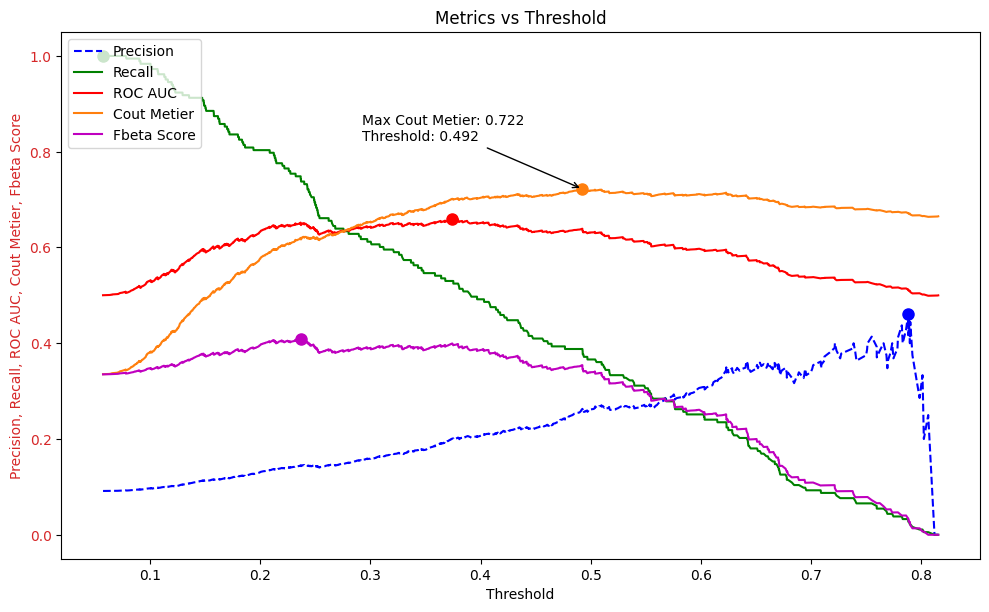

In [ ]:
# Assuming X_train is your training features, y_train is your training labels, and model_smote is your trained model
# Metrics to visualize
metrics_to_visualize = [roc_auc_score, recall_score, f1_score, precision_score, fbeta_score]


# Function to calculate metrics at different thresholds
def calculate_metrics(X, y, model):
    y_pred_proba = model.predict_proba(X)[:, 1]
    precision, recall, thresholds = precision_recall_curve(y, y_pred_proba)
    roc_auc = [roc_auc_score(y, y_pred_proba > threshold) for threshold in thresholds]
    cout_metier_values = [cout_metier(y, y_pred_proba > threshold) for threshold in thresholds]
    fbeta_scores = [fbeta_score(y, y_pred_proba > threshold, beta=2) for threshold in thresholds]

    return thresholds, precision, recall, roc_auc, cout_metier_values, fbeta_scores

# Function to plot metrics vs threshold
def plot_metrics_vs_threshold(X, y, model, metrics_to_visualize):
    fig, ax1 = plt.subplots(figsize=(10, 6))

    thresholds, precision, recall, roc_auc, cout_metier_values, fbeta_scores = calculate_metrics(X, y, model)

    ax1.set_xlabel('Threshold')
    ax1.set_ylabel('Precision, Recall, ROC AUC, Cout Metier, Fbeta Score', color='tab:red')
    ax1.plot(thresholds, precision[:-1], 'b--', label='Precision')
    ax1.plot(thresholds, recall[:-1], 'g-', label='Recall')
    ax1.plot(thresholds, roc_auc, 'r-', label='ROC AUC')
    ax1.plot(thresholds, cout_metier_values, 'tab:orange', label='Cout Metier')
    ax1.plot(thresholds, fbeta_scores, 'm-', label='Fbeta Score')
    ax1.tick_params(axis='y', labelcolor='tab:red')

    # Add legend
    ax1.legend(loc='upper left')

    # Mark maximum values
    max_precision_idx = np.argmax(precision[:-1])
    max_recall_idx = np.argmax(recall[:-1])
    max_roc_auc_idx = np.argmax(roc_auc)
    max_cout_metier_idx = np.argmax(cout_metier_values)
    max_fbeta_score_idx = np.argmax(fbeta_scores)

    ax1.plot(thresholds[max_precision_idx], precision[:-1][max_precision_idx], 'bo', markersize=8, label='Max Precision')
    ax1.plot(thresholds[max_recall_idx], recall[:-1][max_recall_idx], 'go', markersize=8, label='Max Recall')
    ax1.plot(thresholds[max_roc_auc_idx], roc_auc[max_roc_auc_idx], 'ro', markersize=8, label='Max ROC AUC')
    ax1.plot(thresholds[max_cout_metier_idx], cout_metier_values[max_cout_metier_idx], 'o', color='tab:orange', markersize=8, label='Max Cout Metier: {:.3f} (Threshold: {:.3f})'.format(cout_metier_values[max_cout_metier_idx], thresholds[max_cout_metier_idx]))
    ax1.plot(thresholds[max_fbeta_score_idx], fbeta_scores[max_fbeta_score_idx], 'mo', markersize=8, label='Max Fbeta Score: {:.3f} (Threshold: {:.3f})'.format(fbeta_scores[max_fbeta_score_idx], thresholds[max_fbeta_score_idx]))

    # Annotate the maximum Cout Metier value
    ax1.annotate(
        f'Max Cout Metier: {cout_metier_values[max_cout_metier_idx]:.3f}\nThreshold: {thresholds[max_cout_metier_idx]:.3f}',
        xy=(thresholds[max_cout_metier_idx], cout_metier_values[max_cout_metier_idx]),
        xytext=(thresholds[max_cout_metier_idx] - 0.2, cout_metier_values[max_cout_metier_idx] + 0.1),
        arrowprops=dict(facecolor='black', arrowstyle='->'),
    )

    fig.tight_layout()
    plt.title('Metrics vs Threshold')
    plt.show()

# usage
plot_metrics_vs_threshold(val_sample_set.drop(columns=['TARGET']), val_sample_labels, model_us, metrics_to_visualize)


### Metrics

In [166]:
y_proba_us = model_us.predict_proba(val_sample_set.drop(columns = ['TARGET']))[:, 1]
y_pred_proba_us = y_proba_us > 0.49
y_pred_proba_us = np.array(y_pred_proba_us > 0)*1

# Si proba > seuil alors la prédiction est positive : 1
score_us= roc_auc_score(val_sample_labels,y_proba_us)

# Recall
recall_us = recall_score(val_sample_labels,y_pred_proba_us)

# precision
precision_us = precision_score(val_sample_labels, y_pred_proba_us)

# F1
f1_us = f1_score(val_sample_labels, y_pred_proba_us)

#Fbeta
fbeta_us = fbeta_score(val_sample_labels, y_pred_proba_us, beta=2)

print ("ROC auc score : ",score_us)
print("métrique métier : ",cout_metier(val_sample_labels,y_pred_proba_us))
print("Rappel (recall):", recall_us)
print("Précision :", precision_us)
print("F1-score :", f1_us)
print("Fbeta-score  :", fbeta_us)



ROC auc score :  0.7064848982439679
métrique métier :  0.719619326500732
Rappel (recall): 0.3879781420765027
Précision : 0.2563176895306859
F1-score : 0.30869565217391304
Fbeta-score  : 0.3518334985133796


### Lift curve

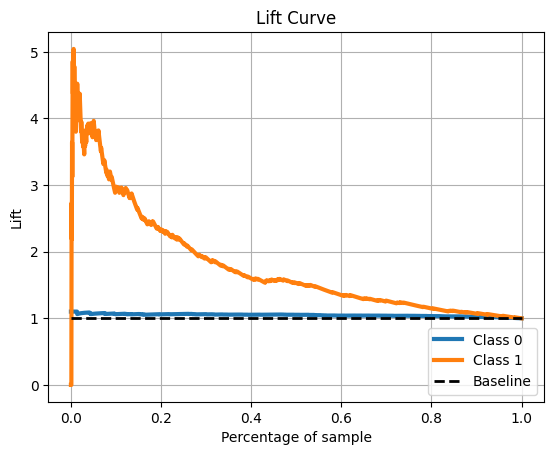

In [ ]:

# Assuming model_us is your classifier and val_sample_set is your validation dataset
y_proba = model_us.predict_proba(val_sample_set.drop(columns=['TARGET']))
skplt.metrics.plot_lift_curve(val_sample_labels, y_proba)
plt.show()

#skplt.metrics.plot_lift_curve(val_sample_labels, model_us.predict_proba(val_sample_set.drop(columns = ['TARGET'])))[:,1]
plt.show()

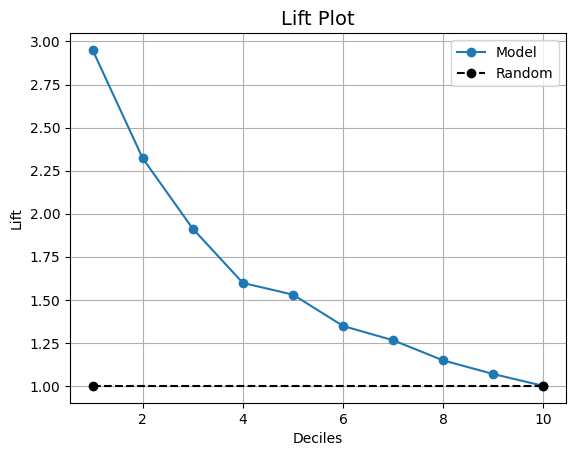

In [ ]:
import kds

# Assuming model_us is your classifier and val_sample_set is your validation dataset
y_proba = model_us.predict_proba(val_sample_set.drop(columns=['TARGET']))[:, 1]

# Use kds.metrics.plot_lift instead of scikitplot
kds.metrics.plot_lift(val_sample_labels, y_proba)
plt.show()

### Matrice de confusion

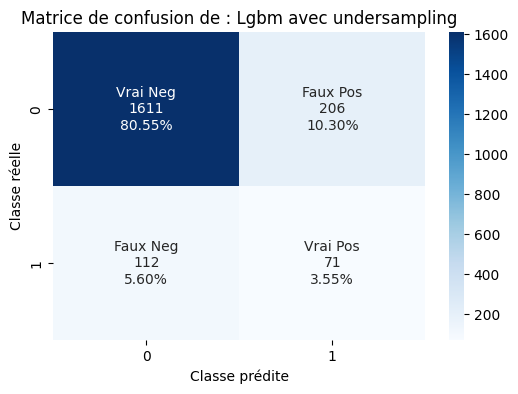

Durée d'exécution de afficher_matrice_confusion: 0.1790623664855957s


In [ ]:
afficher_matrice_confusion(val_sample_labels,y_pred_proba_us, "Lgbm avec undersampling")

In [125]:
save_folder = '/content/drive/MyDrive/Projet 7/'
with open(os.path.join(save_folder, 'best_parameters_us.pkl'), 'wb') as f:
    pickle.dump(best_parameters_us, f)

with open(os.path.join(save_folder, 'feature_importance_us.pkl'), 'wb') as f:
    pickle.dump(feature_importance_us, f)

with open(os.path.join(save_folder, 'model_us.pkl'), 'wb') as f:
    pickle.dump(model_us, f)


In [126]:
best_parameters_us = pickle.load(open("/content/drive/MyDrive/Projet 7/best_parameters_us.pkl", "rb"))
feature_importance_us = pickle.load(open("/content/drive/MyDrive/Projet 7/feature_importance_us.pkl", "rb"))
model_us = pickle.load(open("/content/drive/MyDrive/Projet 7/model_us.pkl", "rb"))

## SMOTE 0.6

In [ ]:
best_parameters_su06, feature_importance_su06, model_su06 = optimisation_model(train_sample_set, lgb.LGBMClassifier(random_state=seed),
                                                                             metric=cout_metier, sm_un=True,
                                                                             n_ite_baye=5
                                                                             )

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stoppe

### Best parameters

In [127]:
best_parameters_su06

{'colsample_by_tree': 0.8,
 'learning_rate': 0.14150835395000952,
 'max_depth': 26.0,
 'n_estimators': 1600.0,
 'num_leaves': 28.0,
 'reg_alpha': 0.30000000000000004,
 'reg_lambda': 0.5,
 'seuil': 0.925,
 'subsample': 0.2}

### Metrics vs Threshold

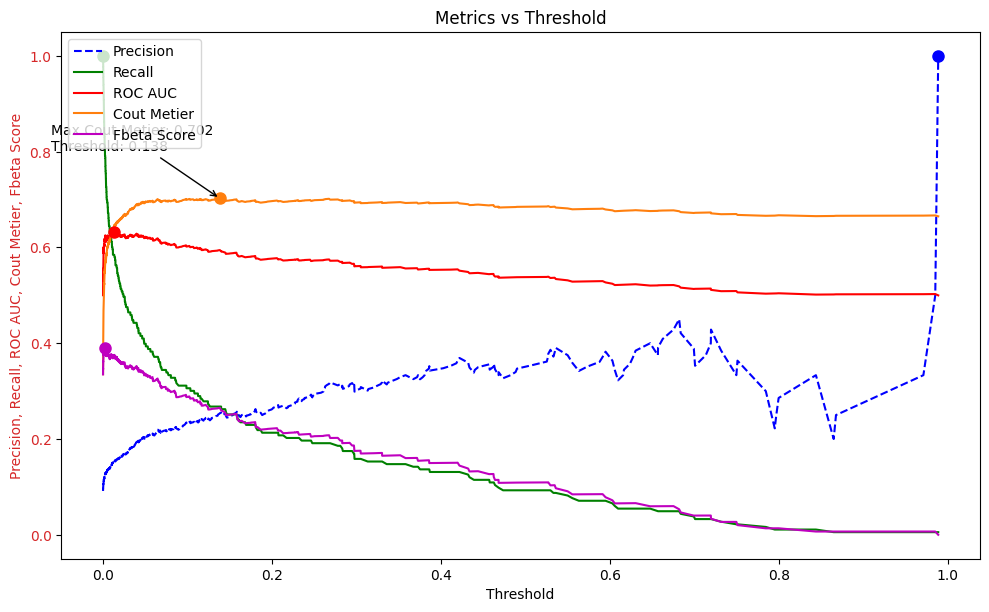

In [ ]:
from sklearn.metrics import precision_recall_curve, roc_auc_score, confusion_matrix
from sklearn.metrics import roc_auc_score, recall_score, f1_score, precision_score, fbeta_score


# Assuming X_train is your training features, y_train is your training labels, and model_smote is your trained model
# Metrics to visualize
metrics_to_visualize = [roc_auc_score, recall_score, f1_score, precision_score, fbeta_score]


# Function to calculate metrics at different thresholds
def calculate_metrics(X, y, model):
    y_pred_proba = model.predict_proba(X)[:, 1]
    precision, recall, thresholds = precision_recall_curve(y, y_pred_proba)
    roc_auc = [roc_auc_score(y, y_pred_proba > threshold) for threshold in thresholds]
    cout_metier_values = [cout_metier(y, y_pred_proba > threshold) for threshold in thresholds]
    fbeta_scores = [fbeta_score(y, y_pred_proba > threshold, beta=2) for threshold in thresholds]

    return thresholds, precision, recall, roc_auc, cout_metier_values, fbeta_scores

# Function to plot metrics vs threshold
def plot_metrics_vs_threshold(X, y, model, metrics_to_visualize):
    fig, ax1 = plt.subplots(figsize=(10, 6))

    thresholds, precision, recall, roc_auc, cout_metier_values, fbeta_scores = calculate_metrics(X, y, model)

    ax1.set_xlabel('Threshold')
    ax1.set_ylabel('Precision, Recall, ROC AUC, Cout Metier, Fbeta Score', color='tab:red')
    ax1.plot(thresholds, precision[:-1], 'b--', label='Precision')
    ax1.plot(thresholds, recall[:-1], 'g-', label='Recall')
    ax1.plot(thresholds, roc_auc, 'r-', label='ROC AUC')
    ax1.plot(thresholds, cout_metier_values, 'tab:orange', label='Cout Metier')
    ax1.plot(thresholds, fbeta_scores, 'm-', label='Fbeta Score')
    ax1.tick_params(axis='y', labelcolor='tab:red')

    # Add legend
    ax1.legend(loc='upper left')

    # Mark maximum values
    max_precision_idx = np.argmax(precision[:-1])
    max_recall_idx = np.argmax(recall[:-1])
    max_roc_auc_idx = np.argmax(roc_auc)
    max_cout_metier_idx = np.argmax(cout_metier_values)
    max_fbeta_score_idx = np.argmax(fbeta_scores)

    ax1.plot(thresholds[max_precision_idx], precision[:-1][max_precision_idx], 'bo', markersize=8, label='Max Precision')
    ax1.plot(thresholds[max_recall_idx], recall[:-1][max_recall_idx], 'go', markersize=8, label='Max Recall')
    ax1.plot(thresholds[max_roc_auc_idx], roc_auc[max_roc_auc_idx], 'ro', markersize=8, label='Max ROC AUC')
    ax1.plot(thresholds[max_cout_metier_idx], cout_metier_values[max_cout_metier_idx], 'o', color='tab:orange', markersize=8, label='Max Cout Metier: {:.3f} (Threshold: {:.3f})'.format(cout_metier_values[max_cout_metier_idx], thresholds[max_cout_metier_idx]))
    ax1.plot(thresholds[max_fbeta_score_idx], fbeta_scores[max_fbeta_score_idx], 'mo', markersize=8, label='Max Fbeta Score: {:.3f} (Threshold: {:.3f})'.format(fbeta_scores[max_fbeta_score_idx], thresholds[max_fbeta_score_idx]))

    # Annotate the maximum Cout Metier value
    ax1.annotate(
        f'Max Cout Metier: {cout_metier_values[max_cout_metier_idx]:.3f}\nThreshold: {thresholds[max_cout_metier_idx]:.3f}',
        xy=(thresholds[max_cout_metier_idx], cout_metier_values[max_cout_metier_idx]),
        xytext=(thresholds[max_cout_metier_idx] - 0.2, cout_metier_values[max_cout_metier_idx] + 0.1),
        arrowprops=dict(facecolor='black', arrowstyle='->'),
    )

    fig.tight_layout()
    plt.title('Metrics vs Threshold')
    plt.show()

# usage
plot_metrics_vs_threshold(val_sample_set.drop(columns=['TARGET']), val_sample_labels, model_su06, metrics_to_visualize)


### Metrics

In [119]:
y_proba_su06 = model_su06.predict_proba(val_sample_set.drop(columns = ['TARGET']))[:, 1]
y_pred_proba_su06 = y_proba_su06 > 0.138
y_proba_su06_acc = y_proba_su06 > 0.5
y_pred_proba_su06 = np.array(y_pred_proba_su06 > 0)*1

# Si proba > seuil alors la prédiction est positive : 1
score_su06= roc_auc_score(val_sample_labels,y_proba_su06)

# Accuracy
accuracy_su06 = accuracy_score(val_sample_labels, y_proba_su06_acc)

# Accuracy_fin
accuracy_su06_fin = accuracy_score(val_sample_labels, y_pred_proba_su06)

# Recall
recall_su06 = recall_score(val_sample_labels,y_pred_proba_su06)

# precision
precision_su06 = precision_score(val_sample_labels, y_pred_proba_su06)

# F1
f1_su06 = f1_score(val_sample_labels, y_pred_proba_su06)

#Fbeta
fbeta_su06 = fbeta_score(val_sample_labels, y_pred_proba_su06, beta=2)

print ("ROC auc score : ",score_su06)
print('Acuracy :', accuracy_su06)
print('Acuracy fin :', accuracy_su06_fin)
print("métrique métier : ",cout_metier(val_sample_labels,y_pred_proba_su06))
print("Rappel (recall):", recall_su06)
print("Précision :", precision_su06)
print("F1-score :", f1_su06)
print("Fbeta-score  :", fbeta_su06)



ROC auc score :  0.7064848982439679
Acuracy : 0.848
Acuracy fin : 0.305
métrique métier :  0.4677891654465593
Rappel (recall): 0.912568306010929
Précision : 0.10837118754055808
F1-score : 0.1937354988399072
Fbeta-score  : 0.3673559172899252


### Lift Curve

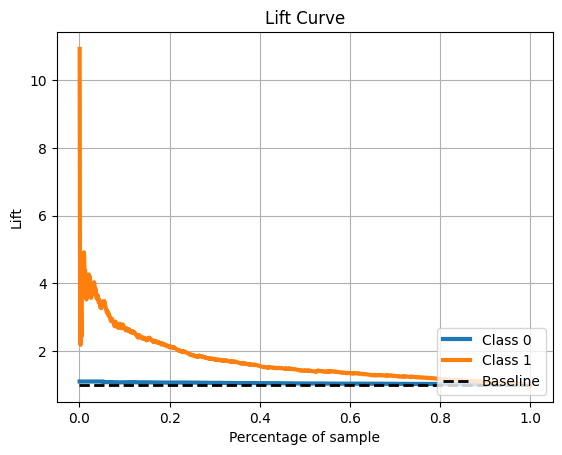

In [ ]:

# Assuming model_us is your classifier and val_sample_set is your validation dataset
y_proba = model_su06.predict_proba(val_sample_set.drop(columns=['TARGET']))
skplt.metrics.plot_lift_curve(val_sample_labels, y_proba)
plt.show()

#skplt.metrics.plot_lift_curve(val_sample_labels, model_us.predict_proba(val_sample_set.drop(columns = ['TARGET'])))[:,1]
plt.show()

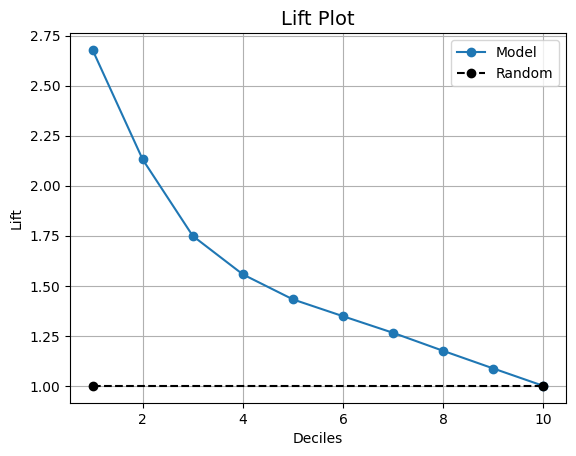

In [ ]:
import kds

# Assuming model_us is your classifier and val_sample_set is your validation dataset
y_proba = model_su06.predict_proba(val_sample_set.drop(columns=['TARGET']))[:, 1]

# Use kds.metrics.plot_lift instead of scikitplot
kds.metrics.plot_lift(val_sample_labels, y_proba)
plt.show()

### Matrice de confusion

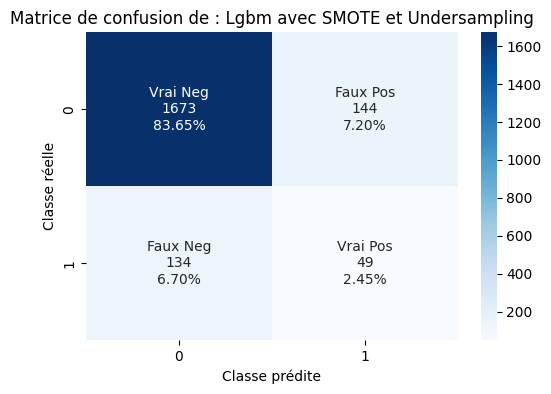

Durée d'exécution de afficher_matrice_confusion: 0.20823168754577637s


In [ ]:
afficher_matrice_confusion(val_sample_labels,y_pred_proba_su06, "Lgbm avec SMOTE et Undersampling")

In [140]:
save_folder = '/content/drive/MyDrive/Projet 7/'
with open(os.path.join(save_folder, 'best_parameters_su06.pkl'), 'wb') as f:
    pickle.dump(best_parameters_su06, f)

with open(os.path.join(save_folder, 'feature_importance_su06.pkl'), 'wb') as f:
    pickle.dump(feature_importance_su06, f)

with open(os.path.join(save_folder, 'model_su06.pkl'), 'wb') as f:
    pickle.dump(model_su06, f)


In [116]:
best_parameters_su06 = pickle.load(open("/content/drive/MyDrive/Projet 7/best_parameters_su06.pkl", "rb"))
feature_importance_su06 = pickle.load(open("/content/drive/MyDrive/Projet 7/feature_importance_su06.pkl", "rb"))
model_su06 = pickle.load(open("/content/drive/MyDrive/Projet 7/model_su06.pkl", "rb"))

## Smote 0.4

In [ ]:
best_parameters_su04, feature_importance_su04, model_su04 = optimisation_model(train_sample_set, lgb.LGBMClassifier(random_state=seed),
                                                                             metric=cout_metier, sm_un=True,
                                                                             n_ite_baye=5
                                                                             )

Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there ar

### Best parameters

In [131]:
best_parameters_su04

{'colsample_by_tree': 0.7000000000000001,
 'learning_rate': 0.010332365425184129,
 'max_depth': 4.0,
 'n_estimators': 200.0,
 'num_leaves': 96.0,
 'reg_alpha': 0.8,
 'reg_lambda': 0.8,
 'seuil': 0.9500000000000001,
 'subsample': 0.2}

### Metrics vs Threshold

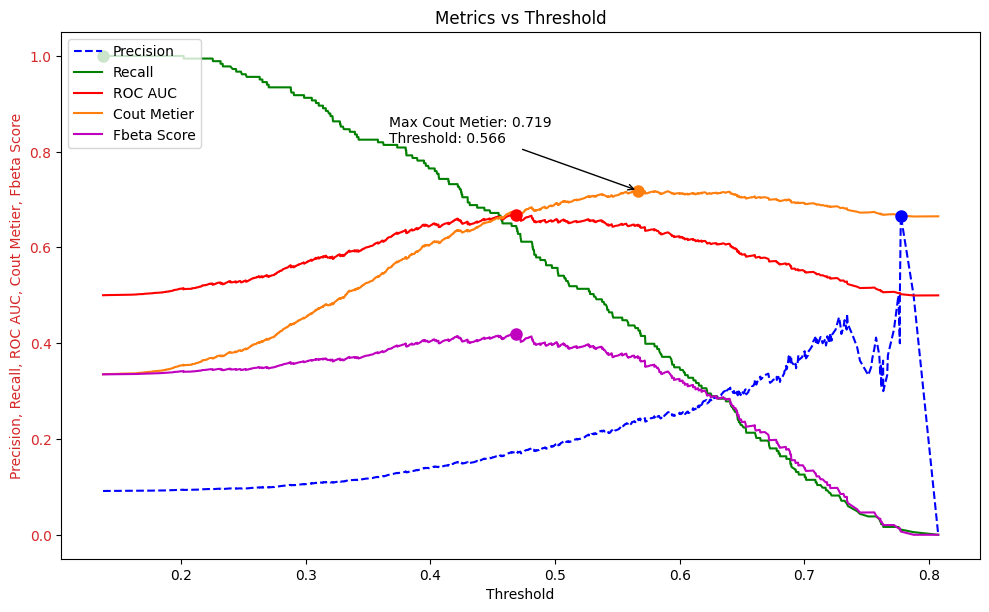

In [133]:
from sklearn.metrics import precision_recall_curve, roc_auc_score, confusion_matrix
from sklearn.metrics import roc_auc_score, recall_score, f1_score, precision_score, fbeta_score


# Assuming X_train is your training features, y_train is your training labels, and model_smote is your trained model
# Metrics to visualize
metrics_to_visualize = [roc_auc_score, recall_score, f1_score, precision_score, fbeta_score]


# Function to calculate metrics at different thresholds
def calculate_metrics(X, y, model):
    y_pred_proba = model.predict_proba(X)[:, 1]
    precision, recall, thresholds = precision_recall_curve(y, y_pred_proba)
    roc_auc = [roc_auc_score(y, y_pred_proba > threshold) for threshold in thresholds]
    cout_metier_values = [cout_metier(y, y_pred_proba > threshold) for threshold in thresholds]
    fbeta_scores = [fbeta_score(y, y_pred_proba > threshold, beta=2) for threshold in thresholds]

    return thresholds, precision, recall, roc_auc, cout_metier_values, fbeta_scores

# Function to plot metrics vs threshold
def plot_metrics_vs_threshold(X, y, model, metrics_to_visualize):
    fig, ax1 = plt.subplots(figsize=(10, 6))

    thresholds, precision, recall, roc_auc, cout_metier_values, fbeta_scores = calculate_metrics(X, y, model)

    ax1.set_xlabel('Threshold')
    ax1.set_ylabel('Precision, Recall, ROC AUC, Cout Metier, Fbeta Score', color='tab:red')
    ax1.plot(thresholds, precision[:-1], 'b--', label='Precision')
    ax1.plot(thresholds, recall[:-1], 'g-', label='Recall')
    ax1.plot(thresholds, roc_auc, 'r-', label='ROC AUC')
    ax1.plot(thresholds, cout_metier_values, 'tab:orange', label='Cout Metier')
    ax1.plot(thresholds, fbeta_scores, 'm-', label='Fbeta Score')
    ax1.tick_params(axis='y', labelcolor='tab:red')

    # Add legend
    ax1.legend(loc='upper left')

    # Mark maximum values
    max_precision_idx = np.argmax(precision[:-1])
    max_recall_idx = np.argmax(recall[:-1])
    max_roc_auc_idx = np.argmax(roc_auc)
    max_cout_metier_idx = np.argmax(cout_metier_values)
    max_fbeta_score_idx = np.argmax(fbeta_scores)

    ax1.plot(thresholds[max_precision_idx], precision[:-1][max_precision_idx], 'bo', markersize=8, label='Max Precision')
    ax1.plot(thresholds[max_recall_idx], recall[:-1][max_recall_idx], 'go', markersize=8, label='Max Recall')
    ax1.plot(thresholds[max_roc_auc_idx], roc_auc[max_roc_auc_idx], 'ro', markersize=8, label='Max ROC AUC')
    ax1.plot(thresholds[max_cout_metier_idx], cout_metier_values[max_cout_metier_idx], 'o', color='tab:orange', markersize=8, label='Max Cout Metier: {:.3f} (Threshold: {:.3f})'.format(cout_metier_values[max_cout_metier_idx], thresholds[max_cout_metier_idx]))
    ax1.plot(thresholds[max_fbeta_score_idx], fbeta_scores[max_fbeta_score_idx], 'mo', markersize=8, label='Max Fbeta Score: {:.3f} (Threshold: {:.3f})'.format(fbeta_scores[max_fbeta_score_idx], thresholds[max_fbeta_score_idx]))

    # Annotate the maximum Cout Metier value
    ax1.annotate(
        f'Max Cout Metier: {cout_metier_values[max_cout_metier_idx]:.3f}\nThreshold: {thresholds[max_cout_metier_idx]:.3f}',
        xy=(thresholds[max_cout_metier_idx], cout_metier_values[max_cout_metier_idx]),
        xytext=(thresholds[max_cout_metier_idx] - 0.2, cout_metier_values[max_cout_metier_idx] + 0.1),
        arrowprops=dict(facecolor='black', arrowstyle='->'),
    )

    fig.tight_layout()
    plt.title('Metrics vs Threshold')
    plt.show()

# usage
plot_metrics_vs_threshold(val_sample_set.drop(columns=['TARGET']), val_sample_labels, model_su04, metrics_to_visualize)


### Mertics

In [111]:
y_proba_su04 = model_su04.predict_proba(val_sample_set.drop(columns = ['TARGET']))[:, 1]
#y_pred_proba_su04 = y_proba_su04 > 0.48
y_pred_proba_su04 = y_proba_su04 > 0.566
y_proba_su04_acc = y_proba_su04 > 0.5
y_pred_proba_su04 = np.array(y_pred_proba_su04 > 0)*1

# Si proba > seuil alors la prédiction est positive : 1
score_su04= roc_auc_score(val_sample_labels,y_proba_su04)

# Accuracy
accuracy_su04 = accuracy_score(val_sample_labels, y_proba_su04_acc)

accuracy_su04_fin = accuracy_score(val_sample_labels, y_pred_proba_su04)

# Recall
recall_su04 = recall_score(val_sample_labels,y_pred_proba_su04)

# precision
precision_su04 = precision_score(val_sample_labels, y_pred_proba_su04)

# F1
f1_su04 = f1_score(val_sample_labels, y_pred_proba_su04)

# Fbeta

fbeta_su04 = fbeta_score(val_sample_labels, y_pred_proba_su04, beta=2)

#print('Seuil : ', best_parameters_su04['seuil'])
print ("ROC auc score : ",score_su04)
print('Acuracy :', accuracy_su04)

print('Acuracy_fin :', accuracy_su04_fin)
print("métrique métier : ",cout_metier(val_sample_labels,y_pred_proba_su04))
print("Rappel (recall):", recall_su04)
print("Précision :", precision_su04)
print("F1-score :", f1_su04)
print("Fbeta-score  :", fbeta_su04)


ROC auc score :  0.7095344214176372
Acuracy : 0.7385
Acuracy_fin : 0.823
métrique métier :  0.7181551976573939
Rappel (recall): 0.43169398907103823
Précision : 0.24012158054711247
F1-score : 0.30859375
Fbeta-score  : 0.3722902921771913


### Lift curve

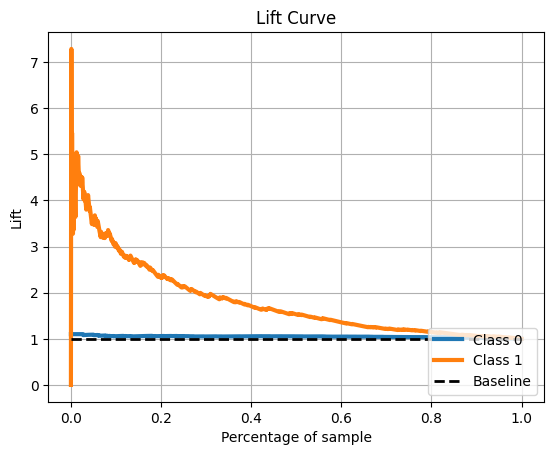

In [135]:

# Assuming model_us is your classifier and val_sample_set is your validation dataset
y_proba = model_su04.predict_proba(val_sample_set.drop(columns=['TARGET']))
skplt.metrics.plot_lift_curve(val_sample_labels, y_proba)
plt.show()

#skplt.metrics.plot_lift_curve(val_sample_labels, model_us.predict_proba(val_sample_set.drop(columns = ['TARGET'])))[:,1]
plt.show()

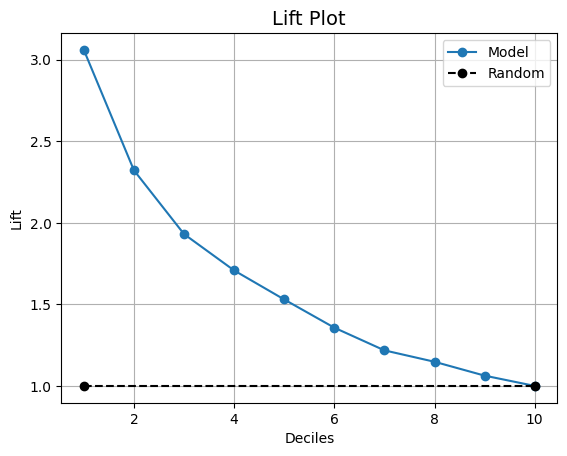

In [136]:
import kds

# Assuming model_us is your classifier and val_sample_set is your validation dataset
y_proba = model_su04.predict_proba(val_sample_set.drop(columns=['TARGET']))[:, 1]

# Use kds.metrics.plot_lift instead of scikitplot
kds.metrics.plot_lift(val_sample_labels, y_proba)
plt.show()

### Martice de confusion

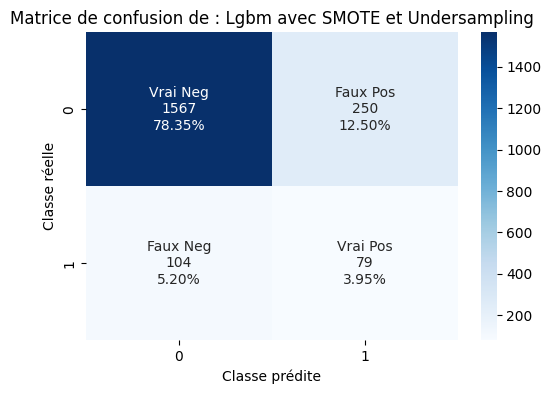

Durée d'exécution de afficher_matrice_confusion: 0.1835179328918457s


In [152]:
afficher_matrice_confusion(val_sample_labels,y_pred_proba_su04, "Lgbm avec SMOTE et Undersampling")

In [138]:
save_folder = '/content/drive/MyDrive/Projet 7/'
with open(os.path.join(save_folder, 'best_parameters_su04.pkl'), 'wb') as f:
    pickle.dump(best_parameters_su04, f)

with open(os.path.join(save_folder, 'feature_importance_su04.pkl'), 'wb') as f:
    pickle.dump(feature_importance_su04, f)

with open(os.path.join(save_folder, 'model_su04.pkl'), 'wb') as f:
    pickle.dump(model_su04, f)


In [36]:
best_parameters_su04 = pickle.load(open("/content/drive/MyDrive/Projet 7/best_parameters_su04.pkl", "rb"))
feature_importance_su04 = pickle.load(open("/content/drive/MyDrive/Projet 7/feature_importance_su04.pkl", "rb"))
model_su04 = pickle.load(open("/content/drive/MyDrive/Projet 7/model_su04.pkl", "rb"))

## Smote 0.2

In [141]:
best_parameters_su02, feature_importance_su02, model_su02 = optimisation_model(train_sample_set, lgb.LGBMClassifier(random_state=seed),
                                                                             metric=cout_metier, sm_un=True,
                                                                             n_ite_baye=5
                                                                             )

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stoppe

### Best parametres

In [142]:
best_parameters_su02

{'colsample_by_tree': 1.0,
 'learning_rate': 0.045244328614248354,
 'max_depth': 22.0,
 'n_estimators': 1200.0,
 'num_leaves': 40.0,
 'reg_alpha': 0.1,
 'reg_lambda': 1.0,
 'seuil': 0.7250000000000001,
 'subsample': 0.4}

### Metrics vs Threshold

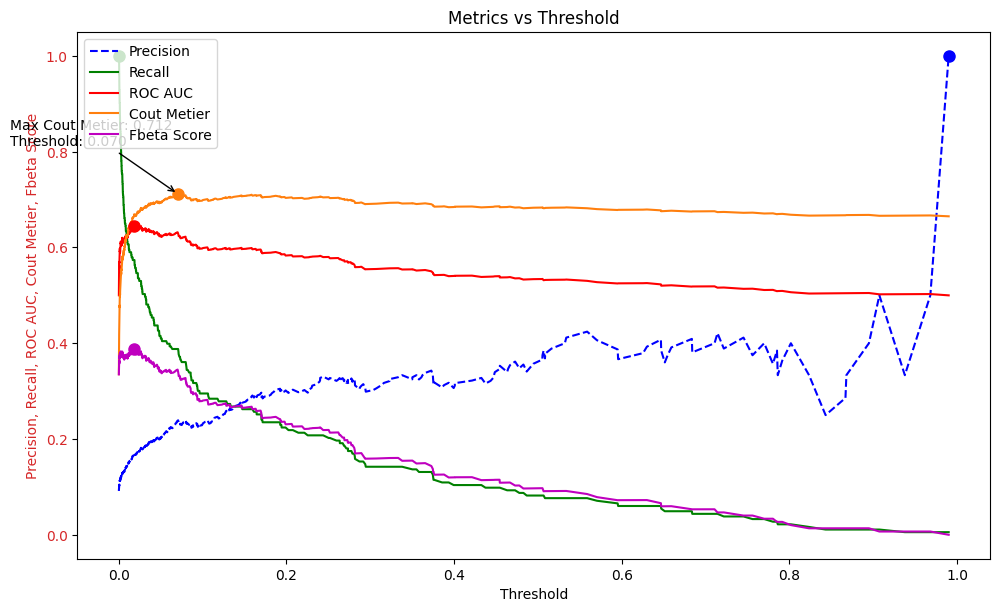

In [143]:
from sklearn.metrics import precision_recall_curve, roc_auc_score, confusion_matrix
from sklearn.metrics import roc_auc_score, recall_score, f1_score, precision_score, fbeta_score


# Assuming X_train is your training features, y_train is your training labels, and model_smote is your trained model
# Metrics to visualize
metrics_to_visualize = [roc_auc_score, recall_score, f1_score, precision_score, fbeta_score]


# Function to calculate metrics at different thresholds
def calculate_metrics(X, y, model):
    y_pred_proba = model.predict_proba(X)[:, 1]
    precision, recall, thresholds = precision_recall_curve(y, y_pred_proba)
    roc_auc = [roc_auc_score(y, y_pred_proba > threshold) for threshold in thresholds]
    cout_metier_values = [cout_metier(y, y_pred_proba > threshold) for threshold in thresholds]
    fbeta_scores = [fbeta_score(y, y_pred_proba > threshold, beta=2) for threshold in thresholds]

    return thresholds, precision, recall, roc_auc, cout_metier_values, fbeta_scores

# Function to plot metrics vs threshold
def plot_metrics_vs_threshold(X, y, model, metrics_to_visualize):
    fig, ax1 = plt.subplots(figsize=(10, 6))

    thresholds, precision, recall, roc_auc, cout_metier_values, fbeta_scores = calculate_metrics(X, y, model)

    ax1.set_xlabel('Threshold')
    ax1.set_ylabel('Precision, Recall, ROC AUC, Cout Metier, Fbeta Score', color='tab:red')
    ax1.plot(thresholds, precision[:-1], 'b--', label='Precision')
    ax1.plot(thresholds, recall[:-1], 'g-', label='Recall')
    ax1.plot(thresholds, roc_auc, 'r-', label='ROC AUC')
    ax1.plot(thresholds, cout_metier_values, 'tab:orange', label='Cout Metier')
    ax1.plot(thresholds, fbeta_scores, 'm-', label='Fbeta Score')
    ax1.tick_params(axis='y', labelcolor='tab:red')

    # Add legend
    ax1.legend(loc='upper left')

    # Mark maximum values
    max_precision_idx = np.argmax(precision[:-1])
    max_recall_idx = np.argmax(recall[:-1])
    max_roc_auc_idx = np.argmax(roc_auc)
    max_cout_metier_idx = np.argmax(cout_metier_values)
    max_fbeta_score_idx = np.argmax(fbeta_scores)

    ax1.plot(thresholds[max_precision_idx], precision[:-1][max_precision_idx], 'bo', markersize=8, label='Max Precision')
    ax1.plot(thresholds[max_recall_idx], recall[:-1][max_recall_idx], 'go', markersize=8, label='Max Recall')
    ax1.plot(thresholds[max_roc_auc_idx], roc_auc[max_roc_auc_idx], 'ro', markersize=8, label='Max ROC AUC')
    ax1.plot(thresholds[max_cout_metier_idx], cout_metier_values[max_cout_metier_idx], 'o', color='tab:orange', markersize=8, label='Max Cout Metier: {:.3f} (Threshold: {:.3f})'.format(cout_metier_values[max_cout_metier_idx], thresholds[max_cout_metier_idx]))
    ax1.plot(thresholds[max_fbeta_score_idx], fbeta_scores[max_fbeta_score_idx], 'mo', markersize=8, label='Max Fbeta Score: {:.3f} (Threshold: {:.3f})'.format(fbeta_scores[max_fbeta_score_idx], thresholds[max_fbeta_score_idx]))

    # Annotate the maximum Cout Metier value
    ax1.annotate(
        f'Max Cout Metier: {cout_metier_values[max_cout_metier_idx]:.3f}\nThreshold: {thresholds[max_cout_metier_idx]:.3f}',
        xy=(thresholds[max_cout_metier_idx], cout_metier_values[max_cout_metier_idx]),
        xytext=(thresholds[max_cout_metier_idx] - 0.2, cout_metier_values[max_cout_metier_idx] + 0.1),
        arrowprops=dict(facecolor='black', arrowstyle='->'),
    )

    fig.tight_layout()
    plt.title('Metrics vs Threshold')
    plt.show()

# usage
plot_metrics_vs_threshold(val_sample_set.drop(columns=['TARGET']), val_sample_labels, model_su02, metrics_to_visualize)


### Metrics

In [114]:
y_proba_su02 = model_su02.predict_proba(val_sample_set.drop(columns = ['TARGET']))[:, 1]
y_pred_proba_su02 = y_proba_su02 > 0.07
y_proba_su02_acc = y_proba_su02 > 0.5
y_pred_proba_su02 = np.array(y_pred_proba_su02 > 0)*1

# Roc_auc_score
score_su02= roc_auc_score(val_sample_labels,y_proba_su02)

# Accuracy
accuracy_su02 = accuracy_score(val_sample_labels, y_proba_su02_acc)

# Accuracy_fin
accuracy_su02_fin = accuracy_score(val_sample_labels, y_pred_proba_su02)

# Recall
recall_su02 = recall_score(val_sample_labels,y_pred_proba_su02)

# precision
precision_su02 = precision_score(val_sample_labels, y_pred_proba_su02)

# F1
f1_su02 = f1_score(val_sample_labels, y_pred_proba_su02)

# F beta
fbeta_su02 = fbeta_score(val_sample_labels, y_pred_proba_su02, beta=2)

#print('Seuil : ', best_parameters_su02['seuil'])
print ("ROC auc score : ",score_su02)
print('Acuracy :', accuracy_su02)
print('Acuracy fin :', accuracy_su02_fin)
print("métrique métier : ",cout_metier(val_sample_labels,y_pred_proba_su02))
print("Rappel (recall):", recall_su02)
print("Précision :", precision_su02)
print("F1-score :", f1_su02)
print("Fbeta-score  :", fbeta_su02)


ROC auc score :  0.6903260343266839
Acuracy : 0.903
Acuracy fin : 0.8305
métrique métier :  0.7119326500732065
Rappel (recall): 0.3879781420765027
Précision : 0.23825503355704697
F1-score : 0.2952182952182952
Fbeta-score  : 0.3446601941747573


### Lift Curve

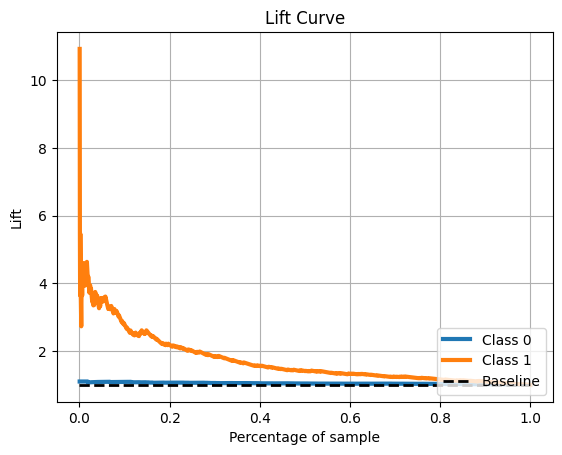

In [146]:

# Assuming model_us is your classifier and val_sample_set is your validation dataset
y_proba = model_su02.predict_proba(val_sample_set.drop(columns=['TARGET']))
skplt.metrics.plot_lift_curve(val_sample_labels, y_proba)
plt.show()

#skplt.metrics.plot_lift_curve(val_sample_labels, model_us.predict_proba(val_sample_set.drop(columns = ['TARGET'])))[:,1]
plt.show()

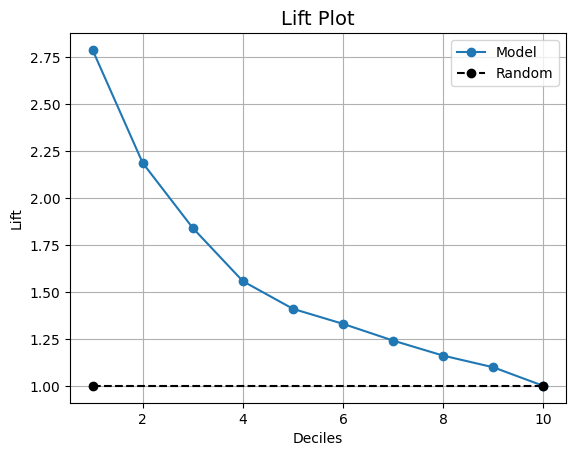

In [147]:
import kds

# Assuming model_us is your classifier and val_sample_set is your validation dataset
y_proba = model_su02.predict_proba(val_sample_set.drop(columns=['TARGET']))[:, 1]

# Use kds.metrics.plot_lift instead of scikitplot
kds.metrics.plot_lift(val_sample_labels, y_proba)
plt.show()

### Matrice de confusion

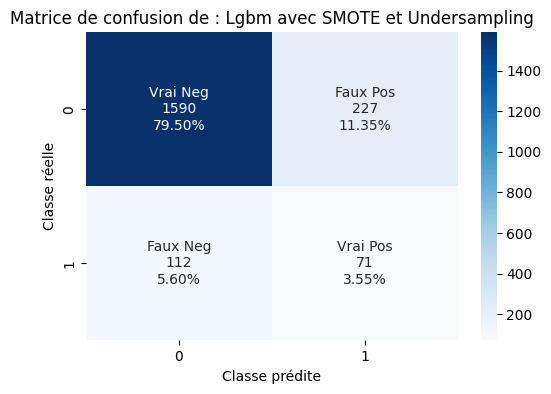

Durée d'exécution de afficher_matrice_confusion: 0.2690703868865967s


In [148]:
afficher_matrice_confusion(val_sample_labels,y_pred_proba_su02, "Lgbm avec SMOTE et Undersampling")

In [153]:
save_folder = '/content/drive/MyDrive/Projet 7/'
with open(os.path.join(save_folder, 'best_parameters_su02.pkl'), 'wb') as f:
    pickle.dump(best_parameters_su02, f)

with open(os.path.join(save_folder, 'feature_importance_su02.pkl'), 'wb') as f:
    pickle.dump(feature_importance_su02, f)

with open(os.path.join(save_folder, 'model_su02.pkl'), 'wb') as f:
    pickle.dump(model_su02, f)


In [104]:
best_parameters_su02 = pickle.load(open("/content/drive/MyDrive/Projet 7/best_parameters_su02.pkl", "rb"))
feature_importance_su02 = pickle.load(open("/content/drive/MyDrive/Projet 7/feature_importance_su02.pkl", "rb"))
model_su02 = pickle.load(open("/content/drive/MyDrive/Projet 7/model_su02.pkl", "rb"))

## Interprétation des résultats avec SHAP

### features importance LightGBM

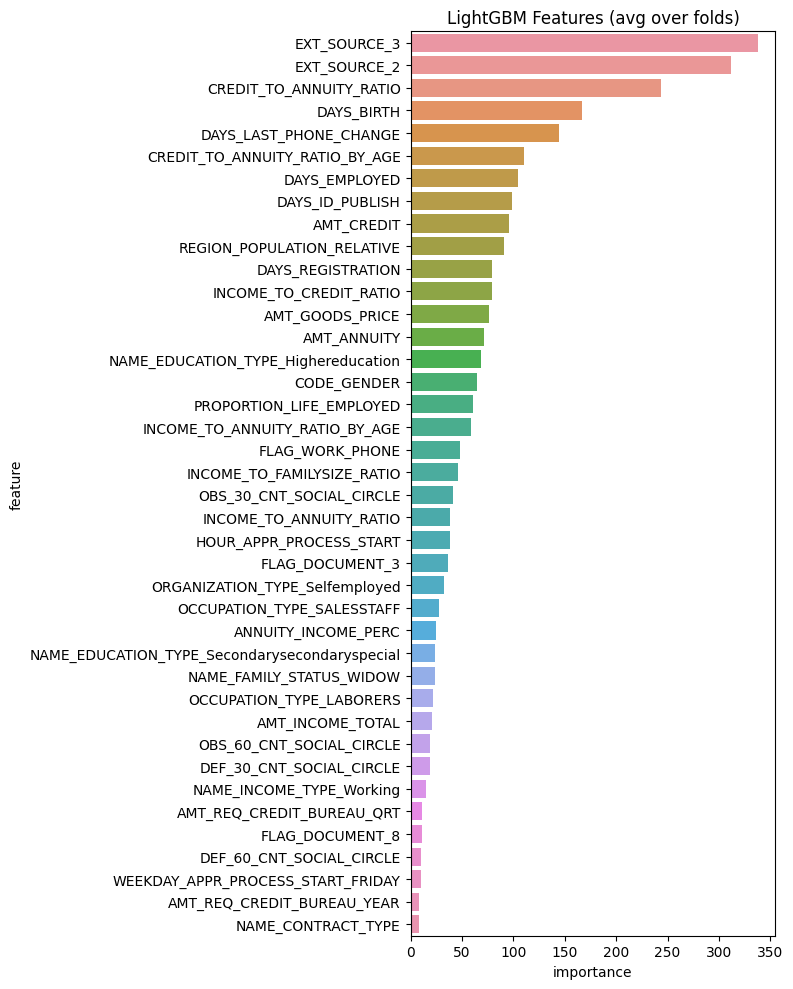

In [38]:
display_importances(feature_importance_su04, train_sample_set)

In [39]:
shap.initjs()

In [40]:
val_sample_set_t =val_sample_set.drop(columns =["TARGET"])
val_sample_set_0 = val_sample_set_t.reset_index()

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray


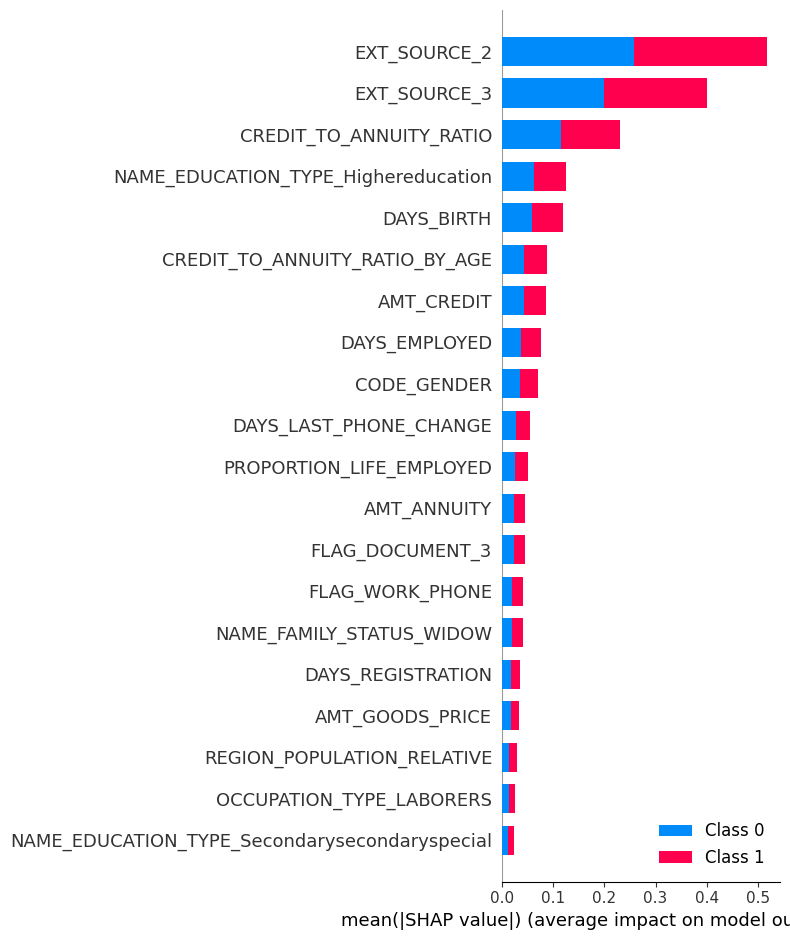

In [42]:
#val_sample_labels = val_sample_labels.astype('float32')
train_sample_labels = train_sample_labels.astype('float32')


explainer_shap = shap.TreeExplainer(model_su04)
shap_values = explainer_shap.shap_values(val_sample_set_t)
# Summary plot
shap.summary_plot(shap_values,val_sample_set.drop(columns =["TARGET"]))

### Shap explication global

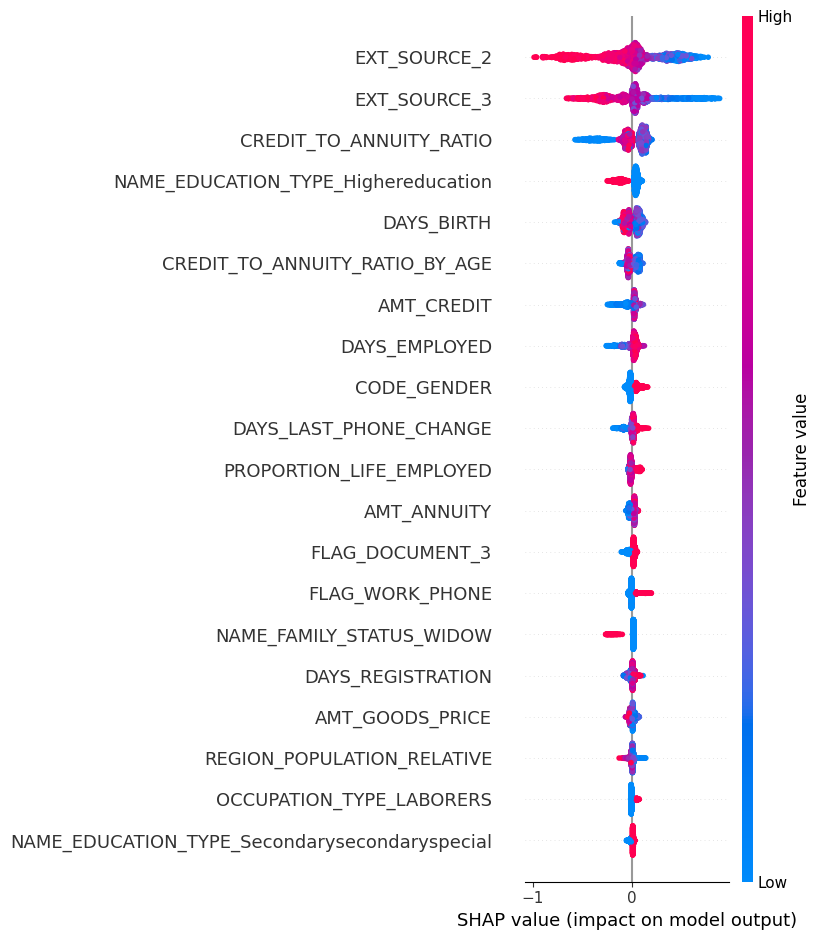

In [43]:
shap.summary_plot(shap_values[1], val_sample_set.drop(columns =["TARGET"]), show=False)

### Interpretation locale

In [47]:
idx = random.randint(1, len(val_sample_set))
print("Client numero : ", val_sample_set_0.iloc[idx,0])
shap.initjs()
shap.force_plot(explainer_shap.expected_value[0], shap_values[0][idx,:], val_sample_set_t.iloc[idx,:])

Client numero :  406467


Client numero :  205297


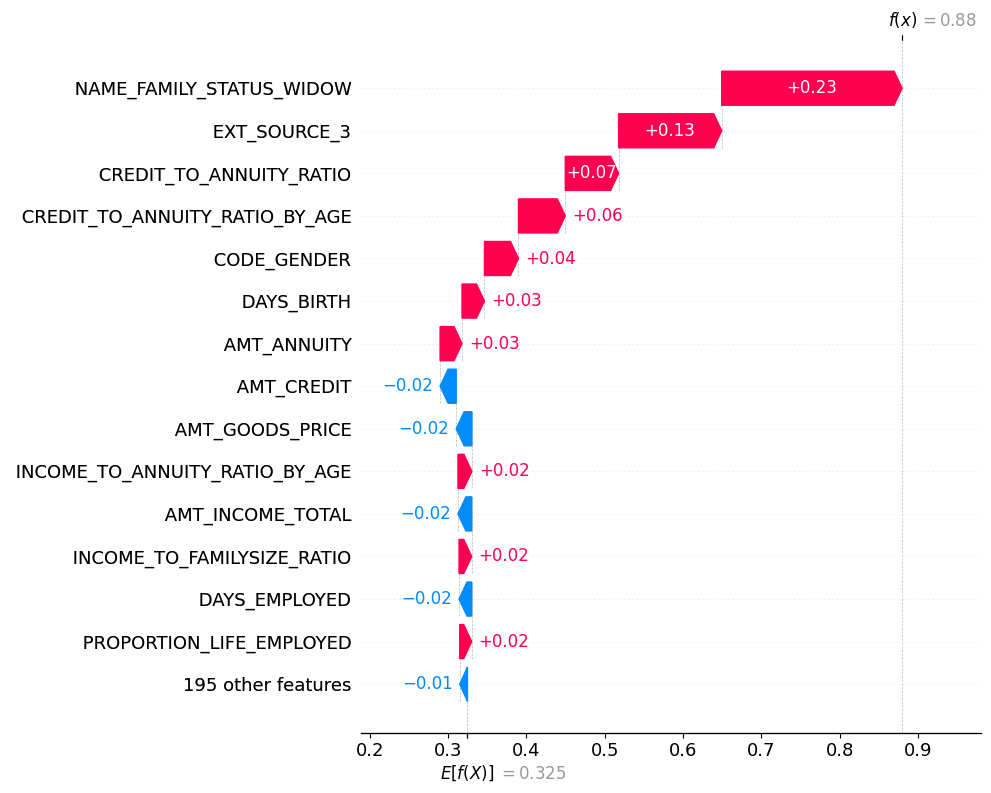

In [85]:
idx = random.randint(1, len(val_sample_set))
print("Client numero : ", val_sample_set_0.iloc[idx,0])
shap.initjs()
shap.plots._waterfall.waterfall_legacy(explainer_shap.expected_value[0], shap_values[0][idx,:], val_sample_set_t.iloc[idx,:], max_display=15)

### Intepritation Client vs Tous les clients

In [102]:
# Valeurs Shapley pour un client spécifique
client_shap_values = shap_values[0][idx]

# Sélectionnez les 15 meilleures fonctionnalités, par exemple
top_features_indices = np.abs(client_shap_values).argsort()[-15:][::-1]
top_features_names = val_sample_set_0.columns[top_features_indices]

# Données pour les fonctionnalités sélectionnées pour tous les clients
data_for_top_features = val_sample_set_0[top_features_names]



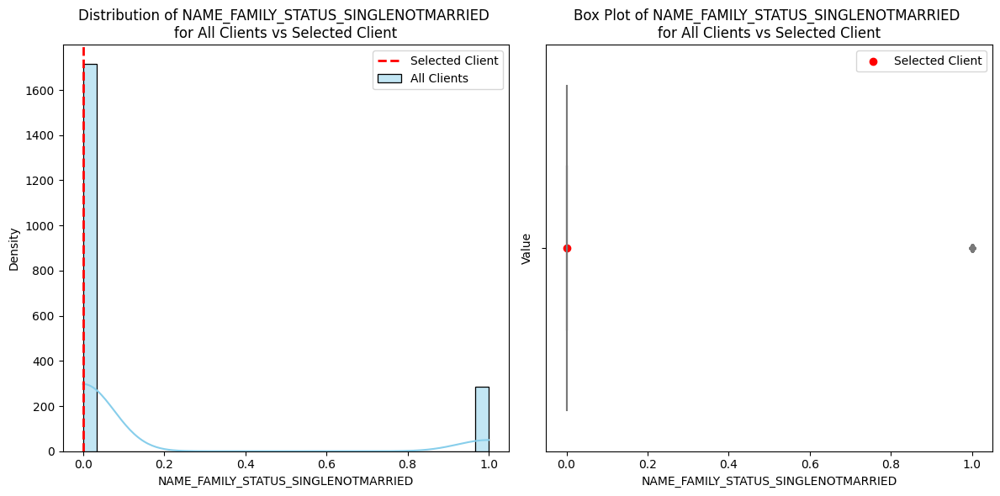

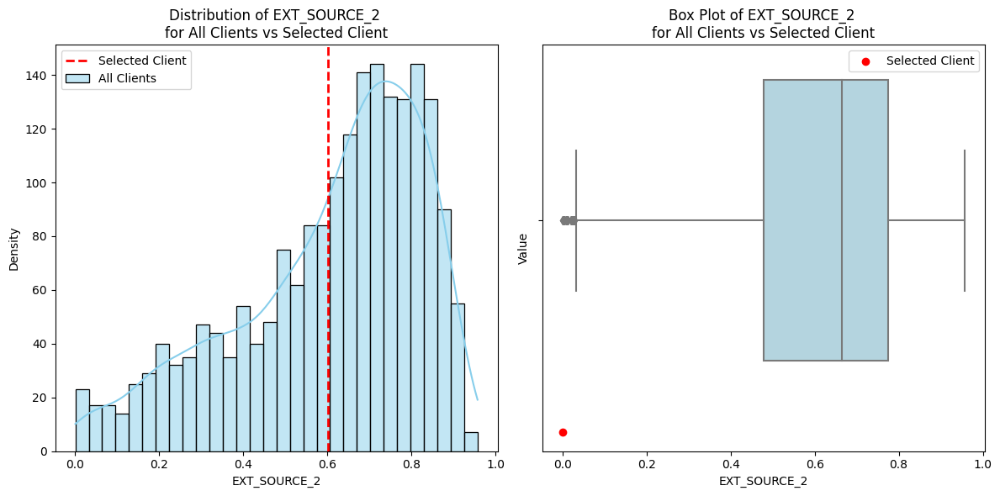

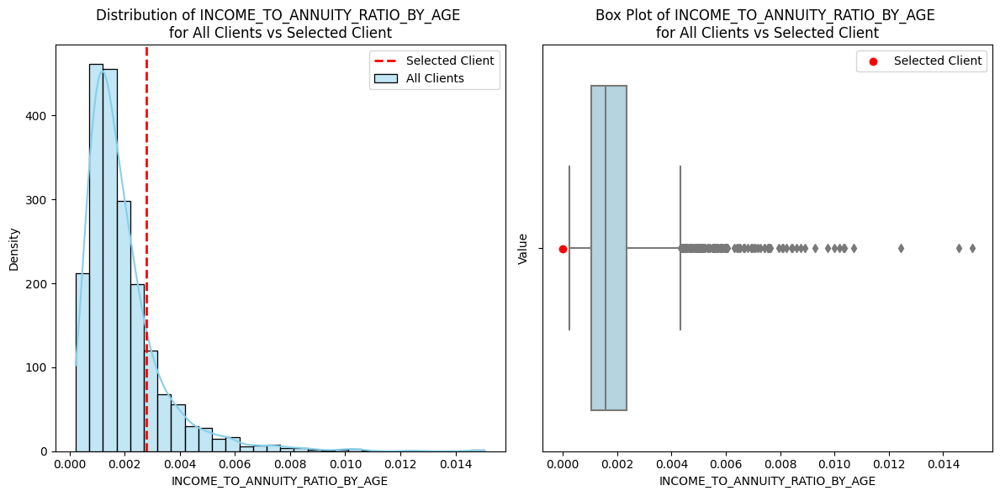

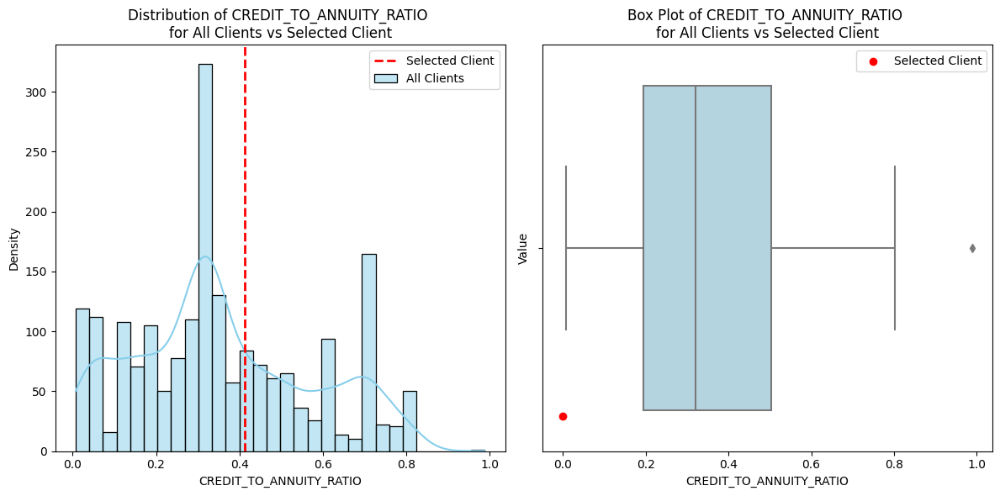

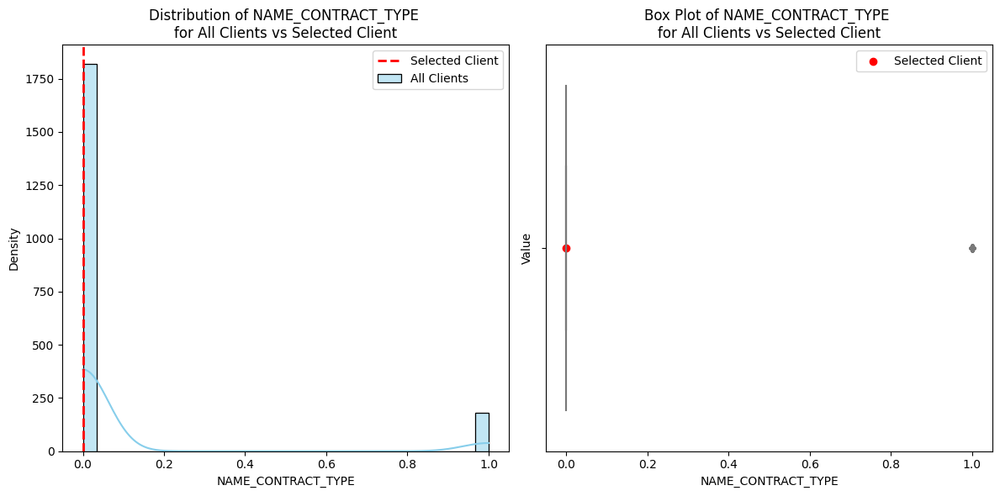

...

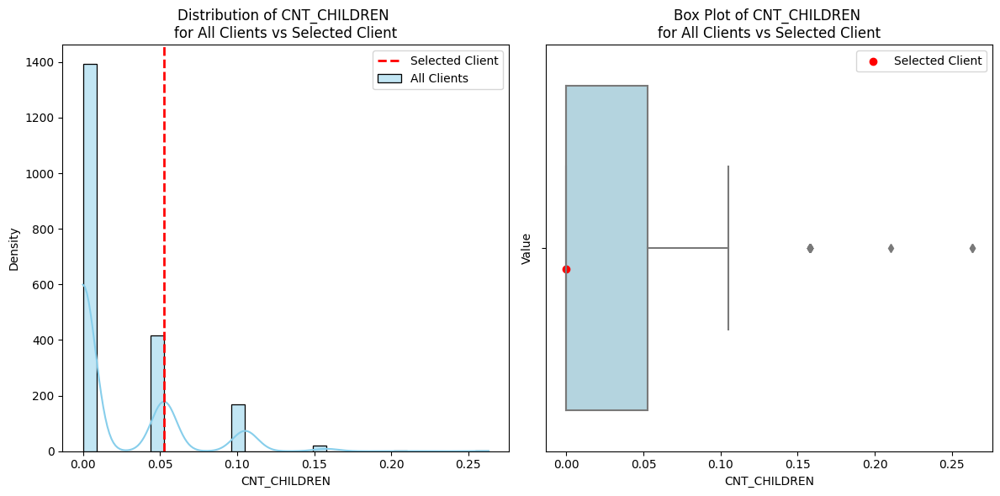

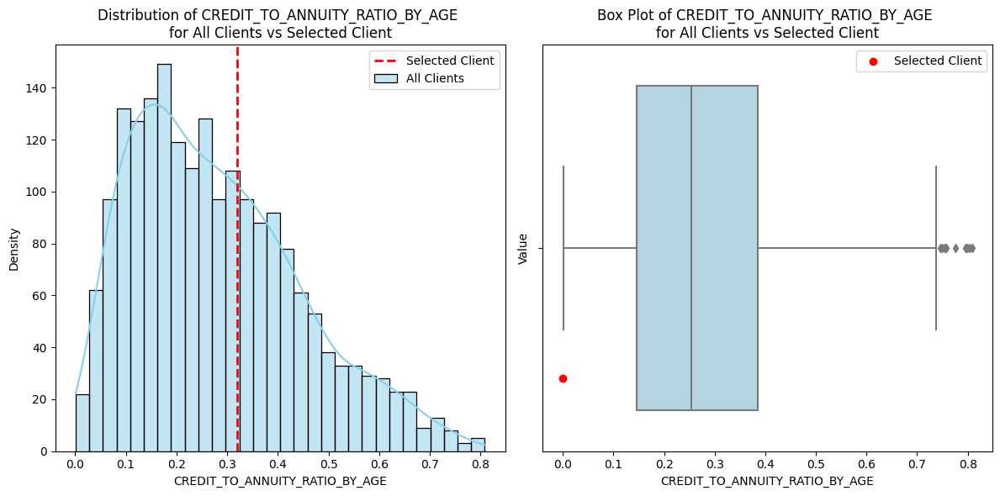

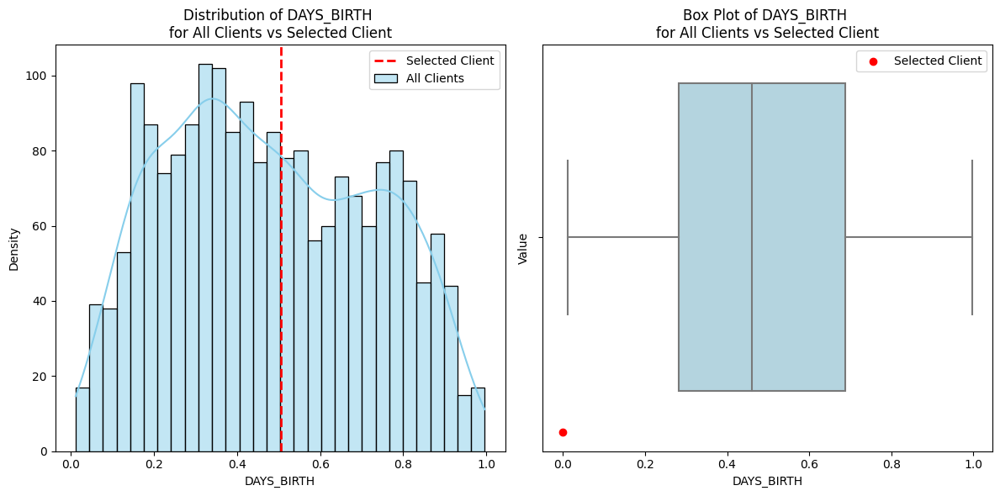

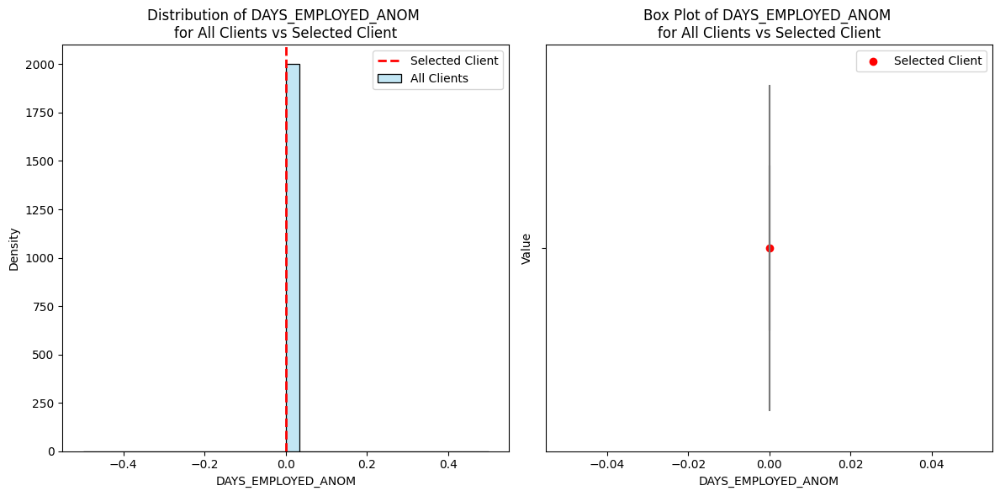

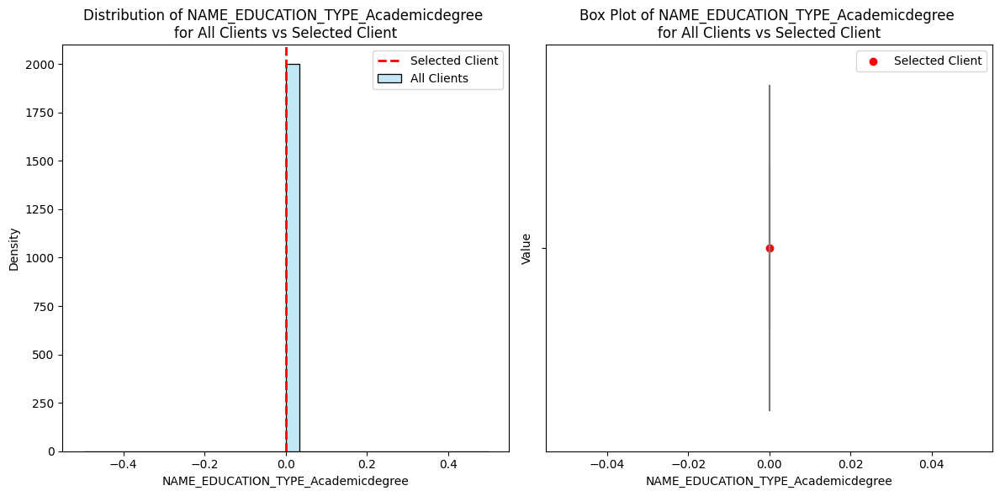

In [100]:
import seaborn as sns


for feature_name in top_features_names:
    plt.figure(figsize=(12, 6))


    plt.subplot(1, 2, 1)
    sns.histplot(data_for_top_features[feature_name], bins=30, kde=True, color='skyblue', label='All Clients')
    plt.axvline(x=data_for_top_features.loc[idx, feature_name], color='red', linestyle='dashed', linewidth=2, label='Selected Client')
    plt.title(f'Distribution of {feature_name} \nfor All Clients vs Selected Client')
    plt.xlabel(feature_name)
    plt.ylabel('Density')
    plt.legend()


    plt.subplot(1, 2, 2)
    sns.boxplot(x=data_for_top_features[feature_name], color='lightblue')
    plt.scatter(x=[0], y=[data_for_top_features.loc[idx, feature_name]], color='red', marker='o', label='Selected Client')
    plt.title(f'Box Plot of {feature_name} \nfor All Clients vs Selected Client')
    plt.xlabel(feature_name)
    plt.ylabel('Value')
    plt.legend()

    plt.tight_layout()
    plt.show()

## Feature engineering

Création de nouvelles variables simples

Catégorisation des variables binaires

Imputation des valeurs manquantes

Encodage des variables catégorielles

Normalisation des variables numériques

In [ ]:
    #train data
    df_train['PROPORTION_LIFE_EMPLOYED'] = df_train['DAYS_EMPLOYED'] / df_train['DAYS_BIRTH']
    df_train['INCOME_TO_CREDIT_RATIO'] = df_train['AMT_INCOME_TOTAL'] / df_train['AMT_CREDIT']
    df_train['INCOME_TO_ANNUITY_RATIO'] = df_train['AMT_INCOME_TOTAL'] / df_train['AMT_ANNUITY']
    df_train['INCOME_TO_ANNUITY_RATIO_BY_AGE'] = df_train['INCOME_TO_ANNUITY_RATIO'] * df_train['DAYS_BIRTH']
    df_train['CREDIT_TO_ANNUITY_RATIO'] = df_train['AMT_CREDIT'] / df_train['AMT_ANNUITY']
    df_train['CREDIT_TO_ANNUITY_RATIO_BY_AGE'] = df_train['CREDIT_TO_ANNUITY_RATIO'] * df_train['DAYS_BIRTH']
    df_train['INCOME_TO_FAMILYSIZE_RATIO'] = df_train['AMT_INCOME_TOTAL'] / df_train['CNT_FAM_MEMBERS']
    df_train['ANNUITY_INCOME_PERC'] = df_train['AMT_ANNUITY'] / df_train['AMT_INCOME_TOTAL']

    #Test data
    df_test['PROPORTION_LIFE_EMPLOYED'] = df_test['DAYS_EMPLOYED'] / df_test['DAYS_BIRTH']
    df_test['INCOME_TO_CREDIT_RATIO'] = df_test['AMT_INCOME_TOTAL'] / df_test['AMT_CREDIT']
    df_test['INCOME_TO_ANNUITY_RATIO'] = df_test['AMT_INCOME_TOTAL'] / df_test['AMT_ANNUITY']
    df_test['INCOME_TO_ANNUITY_RATIO_BY_AGE'] = df_test['INCOME_TO_ANNUITY_RATIO'] * df_test['DAYS_BIRTH']
    df_test['CREDIT_TO_ANNUITY_RATIO'] = df_test['AMT_CREDIT'] / df_train['AMT_ANNUITY']
    df_test['CREDIT_TO_ANNUITY_RATIO_BY_AGE'] = df_test['CREDIT_TO_ANNUITY_RATIO'] * df_test['DAYS_BIRTH']
    df_test['INCOME_TO_FAMILYSIZE_RATIO'] = df_test['AMT_INCOME_TOTAL'] / df_test['CNT_FAM_MEMBERS']
    df_test['ANNUITY_INCOME_PERC'] = df_test['AMT_ANNUITY'] / df_test['AMT_INCOME_TOTAL']


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/

In [ ]:
df_train

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,HOUSETYPE_MODE,WALLSMATERIAL_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,DAYS_EMPLOYED_ANOM,PROPORTION_LIFE_EMPLOYED,INCOME_TO_CREDIT_RATIO,INCOME_TO_ANNUITY_RATIO,INCOME_TO_ANNUITY_RATIO_BY_AGE,CREDIT_TO_ANNUITY_RATIO,CREDIT_TO_ANNUITY_RATIO_BY_AGE,INCOME_TO_FAMILYSIZE_RATIO,ANNUITY_INCOME_PERC
0,100002,1,CASH LOANS,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,UNACCOMPANIED,Working,Secondary / secondary special,SINGLE NOT MARRIED,HOUSE APARTMENT,0.018801,9461,-637.0,-3648.0,-2120,1,1,0,1,1,0,LABORERS,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.262949,0.139376,BLOCK OF FLATS,"STONE, BRICK",2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,False,-0.067329,0.498036,8.198215,77563.308435,16.461104,155738.505192,202500.0,0.121978
1,100003,0,CASH LOANS,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,FAMILY,State servant,Higher education,MARRIED,HOUSE APARTMENT,0.003541,16765,-1188.0,-1186.0,-291,1,1,0,1,1,0,CORE STAFF,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.622246,NaN,BLOCK OF FLATS,BLOCK,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,False,-0.070862,0.208736,7.563343,126799.445355,36.234085,607464.442834,135000.0,0.132217
2,100004,0,REVOLVING LOANS,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,UNACCOMPANIED,Working,Secondary / secondary special,SINGLE NOT MARRIED,HOUSE APARTMENT,0.010032,19046,-225.0,-4260.0,-2531,1,1,1,1,1,0,LABORERS,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.555912,0.729567,NAN,NAN,0.0,0.0,0.0,0.0,-815.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,False,-0.011814,0.500000,10.000000,190460.000000,20.000000,380920.000000,67500.0,0.100000
3,100006,0,CASH LOANS,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,UNACCOMPANIED,Working,Secondary / secondary special,CIVIL MARRIAGE,HOUSE APARTMENT,0.008019,19005,-3039.0,-9833.0,-2437,1,1,0,1,0,0,LABORERS,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,0.650442,NaN,NAN,NAN,2.0,0.0,2.0,0.0,-617.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,False,-0.159905,0.431748,4.547522,86425.648022,10.532818,200176.205093,67500.0,0.219900
4,100007,0,CASH LOANS,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,UNACCOMPANIED,Working,Secondary / secondary special,SINGLE NOT MARRIED,HOUSE APARTMENT,0.028663,19932,-3038.0,-4311.0,-3458,1,1,0,1,0,0,CORE STAFF,1.0,2,2,THURSDAY,11,0,0,0,0,1,1,Religion,0.322738,NaN,NAN,NAN,0.0,0.0,0.0,0.0,-1106.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,False,-0.152418,0.236842,5.556699,110756.122659,23.461618,467636.962338,121500.0,0.179963
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,.

In [ ]:
df_test

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,HOUSETYPE_MODE,WALLSMATERIAL_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,DAYS_EMPLOYED_ANOM,PROPORTION_LIFE_EMPLOYED,INCOME_TO_CREDIT_RATIO,INCOME_TO_ANNUITY_RATIO,INCOME_TO_ANNUITY_RATIO_BY_AGE,CREDIT_TO_ANNUITY_RATIO,CREDIT_TO_ANNUITY_RATIO_BY_AGE,INCOME_TO_FAMILYSIZE_RATIO,ANNUITY_INCOME_PERC
0,100001,CASH LOANS,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,UNACCOMPANIED,Working,Higher education,MARRIED,HOUSE APARTMENT,0.018850,-19241,-2329.0,-5170.0,-812,1,1,0,1,0,1,NAN,2.0,2,2,TUESDAY,18,0,0,0,0,0,0,Kindergarten,0.789654,0.159520,BLOCK OF FLATS,"STONE, BRICK",0.0,0.0,0.0,0.0,-1740.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,False,0.121044,0.237342,6.565988,-126336.178595,23.027874,-4.430793e+05,67500.0,0.152300
1,100005,CASH LOANS,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,UNACCOMPANIED,Working,Secondary / secondary special,MARRIED,HOUSE APARTMENT,0.035792,-18064,-4469.0,-9118.0,-1623,1,1,0,1,0,0,LOWSKILL LABORERS,2.0,2,2,FRIDAY,9,0,0,0,0,0,0,Self-employed,0.291656,0.432962,NAN,NAN,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0,False,0.247398,0.444409,5.699482,-102955.440415,6.240262,-1.127241e+05,49500.0,0.175455
2,100013,CASH LOANS,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,NAN,Working,Higher education,MARRIED,HOUSE APARTMENT,0.019101,-20038,-4458.0,-2175.0,-3503,1,1,0,1,0,0,DRIVERS,2.0,2,2,MONDAY,14,0,0,0,0,0,0,Transport: type 3,0.699787,0.610991,NAN,NAN,0.0,0.0,0.0,0.0,-856.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0,False,0.222477,0.305308,2.902102,-58152.328131,98.261333,-1.968961e+06,101250.0,0.344578
3,100028,CASH LOANS,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,UNACCOMPANIED,Working,Secondary / secondary special,MARRIED,HOUSE APARTMENT,0.026392,-13976,-1866.0,-2000.0,-4208,1,1,0,1,1,0,SALES STAFF,4.0,2,2,WEDNESDAY,11,0,0,0,0,0,0,Business Entity Type 3,0.509677,0.612704,BLOCK OF FLATS,PANEL,0.0,0.0,0.0,0.0,-1805.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0,False,0.133515,0.200000,6.426145,-89811.805747,53.054419,-7.414886e+05,78750.0,0.155614
4,100038,CASH LOANS,M,Y,N,1,180000.0,625500.0,32067.0,625500.0,UNACCOMPANIED,Working,Secondary / secondary special,MARRIED,HOUSE APARTMENT,0.010032,-13040,-2191.0,-4000.0,-4262,1,1,1,1,0,0,NAN,3.0,2,2,FRIDAY,5,0,0,0,0,1,1,Business Entity Type 3,0.425687,NaN,NAN,NAN,0.0,0.0,0.0,0.0,-821.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,False,0.168021,0.287770,5.613247,-73196.744317,28.606709,-3.730315e+05,60000.0,0.178150
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,

In [ ]:
num_vars = df_train.drop(['TARGET', 'SK_ID_CURR'], axis=1).select_dtypes(exclude=['object']).columns
num_vars


Index(['CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY',
       'AMT_GOODS_PRICE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH',
       'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'FLAG_MOBIL',
       'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE',
       'FLAG_EMAIL', 'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT',
       'REGION_RATING_CLIENT_W_CITY', 'HOUR_APPR_PROCESS_START',
       'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION',
       'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY',
       'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'EXT_SOURCE_2',
       'EXT_SOURCE_3', 'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE',
       'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE',
       'DAYS_LAST_PHONE_CHANGE', 'FLAG_DOCUMENT_2', 'FLAG_DOCUMENT_3',
       'FLAG_DOCUMENT_4', 'FLAG_DOCUMENT_5', 'FLAG_DOCUMENT_6',
       'FLAG_DOCUMENT_7', 'FLAG_DOCUMENT_8', 'FLAG_DOCUMENT_9',
       'FLAG_DOCUMENT_10'

In [ ]:
len(num_vars)

68

In [ ]:
cat_vars = df_train.drop(['TARGET', 'SK_ID_CURR'], axis=1).drop(num_vars, axis=1).columns
cat_vars

Index(['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY',
       'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE',
       'WEEKDAY_APPR_PROCESS_START', 'ORGANIZATION_TYPE', 'HOUSETYPE_MODE',
       'WALLSMATERIAL_MODE'],
      dtype='object')

In [ ]:
cat_vars

Index(['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY',
       'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE',
       'WEEKDAY_APPR_PROCESS_START', 'ORGANIZATION_TYPE', 'HOUSETYPE_MODE',
       'WALLSMATERIAL_MODE'],
      dtype='object')

In [ ]:
len(cat_vars)

14

In [ ]:
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler, OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer

In [ ]:
seed = 42

In [ ]:
def build_pipeline(algo_ml, impute_num = SimpleImputer(strategy="median"), impute_var=SimpleImputer(strategy="constant", fill_value="Unknown"), scaler = StandardScaler()):
  # Pipeline de transformation des variables numériques
  numeric_transformer = make_pipeline(
    (impute_num),
    (scaler)
    )

  # Pipeline de transformation des variables catégorielles
  categorical_transformer = make_pipeline(
    (impute_var),
    (OneHotEncoder(handle_unknown="ignore"))
    )

  # Combinaison des 2 étapes en un seul objet
  preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, num_vars),
        ('cat', categorical_transformer, cat_vars)
    ]
    )

  # Pipeline final de Machine Learning
  model = Pipeline(steps=[('preprocessing', preprocessor),
                        ('regressor', algo_ml)])

  return model

In [ ]:
build_pipeline(algo_ml=LogisticRegression(random_state=seed))


Pipeline(steps=[('preprocessing',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('simpleimputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('standardscaler',
                                                                   StandardScaler())]),
                                                  Index(['CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY',
       'AMT_GOODS_PRICE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH',
       'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_...
                                                  Index(['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY',
       'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE',
       'WEEKDAY_APPR_PROCESS_START', 'ORGANIZATION_TYPE', 'HOUSETYPE_MODE',
       'WALLSMATERIAL_MODE'],
      dtype='object'))])),
                ('regressor', LogisticRegression(random_state=42))])

In [ ]:
from sklearn.preprocessing import FunctionTransformer

def remove_high_missing_cols(X, threshold=0.4):
    # Calculate the percentage of missing values for each column
    missing_percentages = X.isnull().mean()

    # Identify columns with missing values exceeding the threshold
    cols_to_drop = missing_percentages[missing_percentages > threshold].index.tolist()

    # Drop the identified columns
    X = X.drop(cols_to_drop, axis=1)

    return X

# Custom transformer using FunctionTransformer
remove_missing_cols_transformer = FunctionTransformer(remove_high_missing_cols, validate=False)

def build_pipeline(algo_ml, impute_num=SimpleImputer(strategy="median"), impute_var=SimpleImputer(strategy="constant", fill_value="Unknown"), scaler=StandardScaler()):
    # Pipeline de transformation des variables numériques
    numeric_transformer = make_pipeline(
        (impute_num),
        (scaler)
    )

    # Pipeline de transformation des variables catégorielles
    categorical_transformer = make_pipeline(
        (impute_var),
        (OneHotEncoder(handle_unknown="ignore"))
    )

    # Combinaison des 2 étapes en un seul objet
    preprocessor = ColumnTransformer(
        transformers=[
            ('remove_missing_cols', remove_missing_cols_transformer, num_vars + cat_vars),
            ('num', numeric_transformer, num_vars),
            ('cat', categorical_transformer, cat_vars)
        ]
    )

    # Pipeline final de Machine Learning
    model = Pipeline(steps=[('preprocessing', preprocessor),
                             ('regressor', algo_ml)])

    return model